#Librerias

In [2]:

import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\danil\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [3]:
# --- IMPORTS BÁSICOS ---
import os, math, random, re, warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from collections import Counter

# NLP / CLUSTERING / MÉTRICAS
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from scipy.stats import wilcoxon, friedmanchisquare

# **IMPORTA TORCH ANTES DE USARLO**
import torch
from sentence_transformers import SentenceTransformer

# Tópicos (gensim)
import gensim
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel, LdaModel

# BERTopic
from umap import UMAP
import hdbscan
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired

from wordcloud import WordCloud

# --- SEMILLAS ---
RANDOM_STATE = 42
os.environ["PYTHONHASHSEED"] = str(RANDOM_STATE)
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

# --- GPU (RTX 4070) ---
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
try:
    torch.set_float32_matmul_precision("high")
except Exception:
    pass
try:
    torch.manual_seed(RANDOM_STATE)
    if DEVICE == "cuda":
        torch.cuda.manual_seed_all(RANDOM_STATE)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True)
except Exception:
    pass

print(f"🟢 Dispositivo embeddings/BERTopic: {DEVICE}")


🟢 Dispositivo embeddings/BERTopic: cuda


In [4]:
import torch
print("torch:", torch.__version__)
print("CUDA disponible:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


torch: 2.8.0+cu126
CUDA disponible: True
GPU: NVIDIA GeForce RTX 4070 Laptop GPU


# Comparación de modelos (LSA,LDA,KMEANS Y BERTopic)

🟢 Dispositivo embeddings/BERTopic: cuda


Batches: 100%|██████████| 212/212 [00:03<00:00, 66.38it/s]


🔎 LSA K óptimo (silhouette cosine): 10 | sil=0.0161


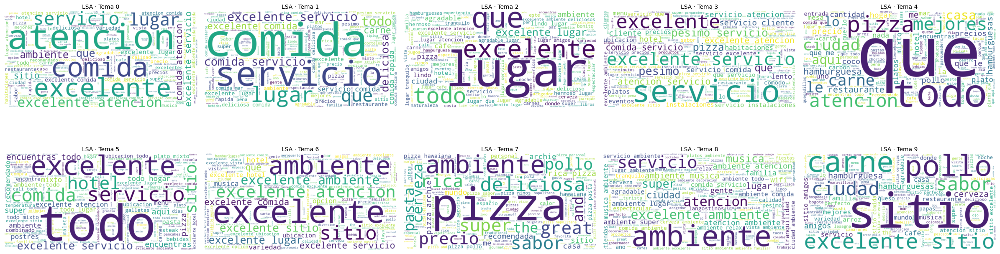

📈 Nubes de palabras guardadas en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LSA_wordclouds.png
🔎 LDA K óptimo (silhouette cosine): 9 | sil=0.0050


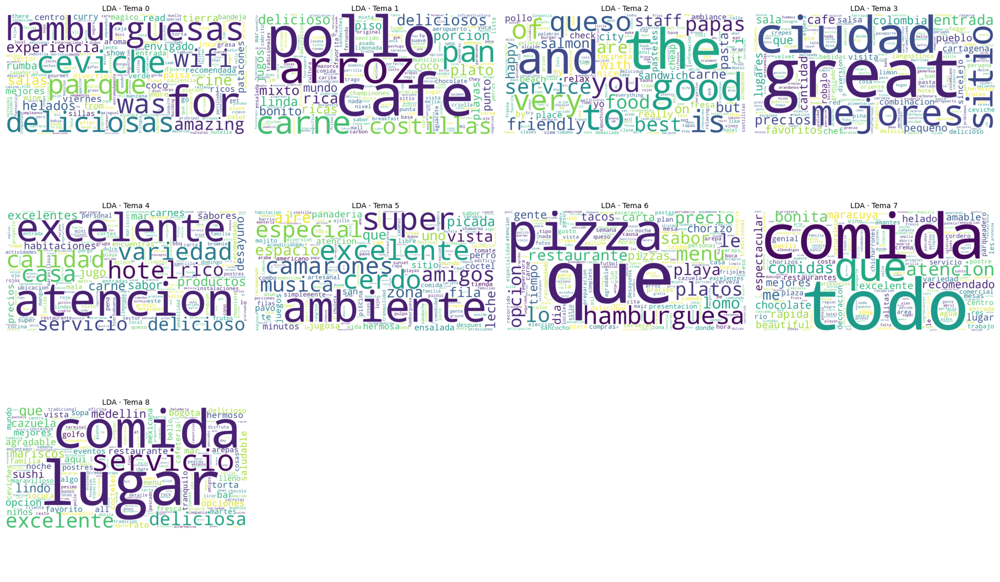

📈 Nubes de palabras guardadas en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LDA_wordclouds.png
🔎 KMeans K óptimo (silhouette cosine): 10 | sil=0.0283


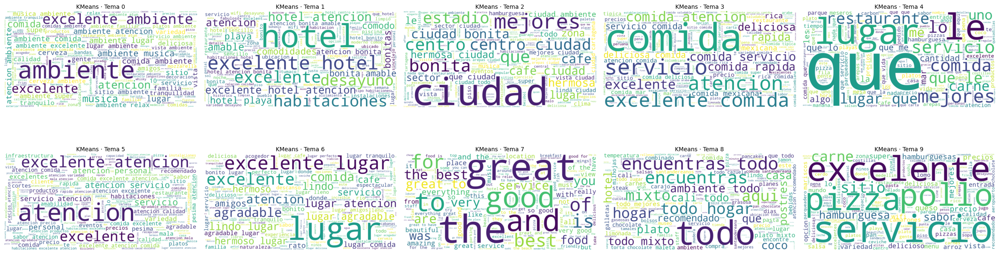

📈 Nubes de palabras guardadas en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\KMeans_wordclouds.png


2025-10-17 09:19:25,533 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-10-17 09:19:25,547 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-10-17 09:19:25,548 - BERTopic - Dimensionality - Completed ✓
2025-10-17 09:19:25,578 - BERTopic - Cluster - Start clustering the reduced embeddings


⚠️ Incompatibilidad UMAP↔scikit-learn detectada (ensure_all_finite/force_all_finite). Usando identidad.


2025-10-17 09:22:24,269 - BERTopic - Cluster - Completed ✓
2025-10-17 09:22:24,289 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-10-17 09:22:25,798 - BERTopic - Representation - Completed ✓


🔢 Clusters iniciales (HDBSCAN, sin -1): 22


2025-10-17 09:22:43,886 - BERTopic - Topic reduction - Reducing number of topics
2025-10-17 09:22:43,946 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-10-17 09:23:00,070 - BERTopic - Representation - Completed ✓
2025-10-17 09:23:00,078 - BERTopic - Topic reduction - Reduced number of topics from 23 to 9


🎯 Clusters que se grafican: 8 (modo: forzado a 9)


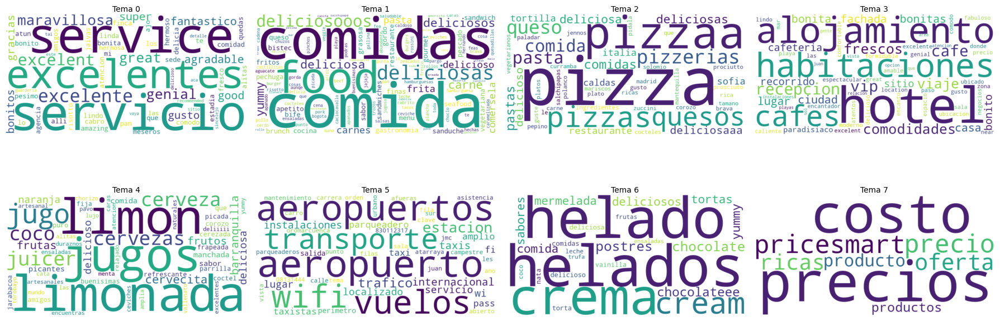

📈 Nube(s) de palabras guardada(s) en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\bertopic_plots\wordcloud_grid_8_topics_forced_seed42.png
✅ Archivo Excel con métricas: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\metricas_clusters_por_modelo.xlsx
🖼️ Wordclouds (K óptimo silhouette / BERTopic grid):
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LSA_wordclouds.png
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LDA_wordclouds.png
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\KMeans_wordclouds.png
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\bertopic_plots\wordcloud_grid_8_topics_forced_seed42.png


,modelo,cluster,n_docs,varianza_explicada,coseno_intra_tfidf,sim_semantica_intra,wilcoxon_stat,wilcoxon_p,coherencia_npmi,topic_uniqueness,silhouette_model,friedman_stat,friedman_p,perplejidad,diversidad_tematica_global
0,LSA,0,1014,0.009333,0.021386,0.285373,291850.0,8.864615e-53,-0.015244,0.297678,0.016079,10409.096590,0.0,NaN,0.45475
1,LSA,1,405,0.008360,0.060181,0.413267,78893.0,3.915016e-58,-0.080115,0.369416,0.016079,10409.096590,0.0,NaN,0.45475
2,LSA,2,674,0.007522,0.026010,0.321927,216542.0,3.509798e-92,-0.112408,0.450663,0.016079,10409.096590,0.0,NaN,0.45475
3,LSA,3,272,0.007242,0.081647,0.387900,36387.0,3.545566e-43,-0.233978,0.506690,0.016079,10409.096590,0.0,NaN,0.45475
4,LSA,4,865,0.006517,0.015045,0.285713,364599.0,6.860697e-129,-0.158085,0.507501,0.016079,10409.096590,0.0,NaN,0.45475
5,LSA,5,139,0.006504,0.184968,0.397269,9730.0,6.778002e-25,-0.290480,0.432468,0.016079,10409.096590,0.0,NaN,0.45475
6,LSA,6,454,0.005785,0.021837,0.283378,100617.0,6.118596e-69,-0.157894,0.419207,0.016079,10409.096590,0.0,NaN,0.45475
7,LSA,7,633,0.005371,0.025599,0.257154,194316.0,5.672665e-93,-0.273890,0.592648,0.016079,10409.096590,0.0,NaN,0.45475
8,LSA,8,288,0.005206,0.043169,0.298248,41237.0,1.403210e-47,-0.271546,0.503239,0.016079,10409.096590,0.0,NaN,0.45475
9,LSA,9,2023,0.004199,0.006293,0.299067,1845842.0,3.120820e-215,-0.141070,0.467990,0.016079,10409.096590,0.0,NaN,0.45475



Vista rápida de BT topics_info (incluye n_keywords):
 Topic  Count                                          Name                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [5]:
# =========================================
#     Pipeline unificado de evaluación de tópicos
#     LSA / LDA / KMeans / BERTopic
#     (PREPROCESAMIENTO ROBUSTO + NOUN CHUNKS)
# =========================================

# ---------- Lectura ----------
import pandas as pd
input_file = 'df_con_tipo_turista.xlsx'  # <-- ajusta si es necesario
df = pd.read_excel(input_file)

# ---------- IMPORTS BÁSICOS ----------
import os, math, random, re, warnings, unicodedata
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

# NLP / CLUSTERING / MÉTRICAS
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from sklearn.preprocessing import normalize
from scipy.stats import wilcoxon, friedmanchisquare

# Torch / embeddings
import torch
from sentence_transformers import SentenceTransformer

# Tópicos (gensim)
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel, LdaModel

# BERTopic + HDBSCAN + UMAP + KeyBERTInspired
import hdbscan
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
try:
    from umap import UMAP
    HAS_UMAP = True
except Exception:
    HAS_UMAP = False

# Stopwords ES
from spacy.lang.es.stop_words import STOP_WORDS as SPACY_STOP_WORDS
from wordcloud import WordCloud

# ---------- Semillas / determinismo ----------
RANDOM_STATE = 42
os.environ["PYTHONHASHSEED"] = str(RANDOM_STATE)
os.environ["TOKENIZERS_PARALLELISM"] = "false"
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

# ---------- GPU ----------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
try:
    torch.set_float32_matmul_precision("high")
except Exception:
    pass
try:
    torch.manual_seed(RANDOM_STATE)
    if DEVICE == "cuda":
        torch.cuda.manual_seed_all(RANDOM_STATE)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True)
except Exception:
    pass
print(f"🟢 Dispositivo embeddings/BERTopic: {DEVICE}")

# ============================================================
#  PREPROCESAMIENTO ROBUSTO + NOUN CHUNKS
# ============================================================

class TextProcessing(object):
    def __init__(self, lang: str = 'es'):
        self.lang = lang
        self.nlp = self.load_spacy(lang)

    @staticmethod
    def load_spacy(lang: str):
        import spacy
        from spacy import cli as spacy_cli
        spacy_model = {'es': 'es_core_news_sm', 'en': 'en_core_web_sm'}
        pkg = spacy_model.get(lang, 'es_core_news_sm')
        try:
            if not spacy.util.is_package(pkg):
                spacy_cli.download(pkg)
            return spacy.load(pkg)
        except Exception as e:
            print(f'Error loading spaCy: {e}')
            raise

    @staticmethod
    def proper_encoding(text: str) -> str:
        if not isinstance(text, str):
            return ''
        try:
            text = unicodedata.normalize('NFD', text)
            text = text.encode('ascii', 'ignore')
            return text.decode("utf-8")
        except Exception:
            return text

    @staticmethod
    def remove_patterns(text: str) -> str:
        if not isinstance(text, str):
            return ''
        try:
            text = re.sub(r'[©×⇔_»«~#$€Â�¬]', '', text)
            text = re.sub(r'\b\d+(?:\.\d+)?\s+', ' ', text)
            text = re.sub(r'[^\w\sáéíóúüñÁÉÍÓÚÜÑ]', ' ', text)
            return text.lower()
        except Exception:
            return text

    def transformer(self, text: str, remove_stopwords: bool = False) -> str:
        if not isinstance(text, str):
            return ''
        try:
            t = self.proper_encoding(text).lower()
            t = re.sub("[\U0001f000-\U000e007f]", " ", t)  # emojis → espacio
            t = re.sub(
                r'(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)'
                r'(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+'
                r'(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:\'".,<>?«»“”‘’]))',
                ' ', t
            )
            t = re.sub(r"@([A-Za-z0-9_]{1,40})", ' ', t)
            t = re.sub(r"#([A-Za-z0-9_]{1,40})", ' ', t)
            t = self.remove_patterns(t)
            if remove_stopwords:
                doc = self.nlp(t)
                t = ' '.join([tok.text for tok in doc if not tok.is_stop])
            t = re.sub(r'\s+', ' ', t).strip()
            return t if t != ' ' else ''
        except Exception:
            return text

    def noun_chunks(self, text: str) -> str:
        if not isinstance(text, str) or not text.strip():
            return ""
        try:
            doc = self.nlp(text)
            chunks = []
            for chunk in doc.noun_chunks:
                tokens_clean = [t.text for t in chunk if not (t.is_stop and len(chunk) > 1)]
                chunk_text = " ".join(tokens_clean).strip()
                if len(chunk_text) >= 2:
                    chunks.append(chunk_text.lower())
            out = " ".join(chunks)
            out = re.sub(r'\s+', ' ', out).strip()
            return out
        except Exception:
            return ""

    def extract_noun_chunks_bulk(self, texts):
        out = []
        try:
            for doc in self.nlp.pipe((t if isinstance(t, str) else "" for t in texts),
                                     batch_size=256, n_process=1):
                chunks = []
                for chunk in doc.noun_chunks:
                    tokens_clean = [t.text for t in chunk if not (t.is_stop and len(chunk) > 1)]
                    chunk_text = " ".join(tokens_clean).strip().lower()
                    if len(chunk_text) >= 2:
                        chunks.append(chunk_text)
                text_out = " ".join(chunks)
                text_out = re.sub(r'\s+', ' ', text_out).strip()
                out.append(text_out)
            return out
        except Exception:
            for t in texts:
                out.append(self.noun_chunks(str(t) if t is not None else ""))
            return out

def pick_text_column(df):
    candidates = ["Comentario_preprocesado","Comentario","comment","review","texto","text"]
    for c in candidates:
        if c in df.columns:
            return c
    raise KeyError(f"No se encontró ninguna columna de texto. Esperaba una de: {candidates}")

# --- 1) Selección de columna y limpieza robusta ---
base_col = pick_text_column(df)
tp = TextProcessing(lang='es')

df["Text_clean"] = df[base_col].astype(str).map(tp.transformer)

# --- 2) noun chunks sobre el texto limpio ---
df["Noun_Chunks"] = tp.extract_noun_chunks_bulk(df["Text_clean"].astype(str).tolist())

# --- 3) documentos finales para TODO el pipeline ---
docs_series = pd.Series(df["Noun_Chunks"]).astype(str).fillna("").str.strip()
mask = docs_series.str.len() > 0
docs = docs_series[mask].tolist()
orig_index = df.index[mask]
if len(docs) == 0:
    raise RuntimeError("No hay documentos válidos después del preprocesamiento.")

# ============================================================
#   Representaciones compartidas (sobre Noun_Chunks)
# ============================================================

TOPN_WORDS = 400            # LSA/LDA/KMeans wordclouds
TOP_N_KEYWORDS = 1000        # BERTopic

tfidf_vec = TfidfVectorizer(
    lowercase=True,
    token_pattern=r"(?u)\b\w\w+\b",
    min_df=2, max_df=0.98,
    ngram_range=(1,3),
    dtype=np.float32
)
X_tfidf = tfidf_vec.fit_transform(docs)
tfidf_terms = np.array(tfidf_vec.get_feature_names_out())

EMBEDDING_MODEL_NAME = "sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2"
embedder = SentenceTransformer(EMBEDDING_MODEL_NAME, device=DEVICE)
X_emb = embedder.encode(
    docs,
    show_progress_bar=True,
    normalize_embeddings=True,
    convert_to_numpy=True
).astype(np.float32)

tokenized = [t.split() for t in docs]
dictionary = Dictionary(tokenized)
dictionary.filter_extremes(no_below=2, no_above=0.98)
corpus = [dictionary.doc2bow(toks) for toks in tokenized]

# Carpeta local
BASE_DIR = os.path.abspath(os.path.join(".", "cluster_eval"))
SAVE_DIR = BASE_DIR
PLOT_DIR = os.path.join(BASE_DIR, "bertopic_plots")
os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

# ============================================================
#   Utilidades métricas y visuales
# ============================================================

def safe_silhouette_score(X, labels, max_samples=5000, metric="cosine"):
    labels = np.asarray(labels)
    if len(set(labels)) <= 1:
        return np.nan
    n = X.shape[0]
    if n > max_samples:
        rng = np.random.RandomState(RANDOM_STATE)
        idx = rng.choice(n, size=max_samples, replace=False)
        X_sub, labels_sub = X[idx], labels[idx]
    else:
        X_sub, labels_sub = X, labels
    try:
        return float(silhouette_score(X_sub, labels_sub, metric=metric))
    except Exception:
        return np.nan

def top_terms_from_vector(vec, terms, topn=20):
    idx = np.argpartition(vec, -topn)[-topn:]
    idx = idx[np.argsort(-vec[idx])]
    return [(terms[i], float(vec[i])) for i in idx]

def topic_uniqueness(all_topic_words):
    flat = [w for words in all_topic_words for w in words]
    counts = Counter(flat)
    unq_scores = []
    for words in all_topic_words:
        if not words:
            unq_scores.append(np.nan); continue
        scores = [1.0 / counts[w] for w in words]
        unq_scores.append(float(np.mean(scores)))
    return unq_scores

def topic_diversity(all_topic_words):
    total = sum(len(ws) for ws in all_topic_words)
    if total == 0: return np.nan
    unique_words = len(set([w for ws in all_topic_words for w in ws]))
    return unique_words / total

def avg_intra_cosine(X, labels, max_sample=1000):
    labels = np.asarray(labels)
    avg_per_cluster = {}
    for c in sorted(set(labels)):
        idx = np.where(labels == c)[0]
        if len(idx) < 2:
            avg_per_cluster[c] = np.nan; continue
        sel = idx if len(idx) <= max_sample else np.random.RandomState(RANDOM_STATE).choice(idx, size=max_sample, replace=False)
        S = cosine_similarity(X[sel], X[sel])
        m = (np.sum(S) - np.trace(S)) / (S.shape[0]*S.shape[0] - S.shape[0])
        avg_per_cluster[c] = float(m)
    return avg_per_cluster

def avg_intra_semantic_cosine(emb, labels, max_sample=2000):
    labels = np.asarray(labels)
    avg_per_cluster = {}
    for c in sorted(set(labels)):
        idx = np.where(labels == c)[0]
        if len(idx) < 2:
            avg_per_cluster[c] = np.nan; continue
        sel = idx if len(idx) <= max_sample else np.random.RandomState(RANDOM_STATE).choice(idx, size=max_sample, replace=False)
        S = cosine_similarity(emb[sel], emb[sel])
        m = (np.sum(S) - np.trace(S)) / (S.shape[0]*S.shape[0] - S.shape[0])
        avg_per_cluster[c] = float(m)
    return avg_per_cluster

def wilcoxon_own_vs_other_sparse(X_csr, labels, centroids):
    labels = np.asarray(labels)
    clusters_sorted = sorted(set(labels))
    Xn = normalize(X_csr, norm='l2', copy=True)
    cent = centroids.astype(np.float32)
    cent /= (np.linalg.norm(cent, axis=1, keepdims=True) + 1e-12).astype(np.float32)
    results = {}
    for idx_c, c in enumerate(clusters_sorted):
        rows = np.where(labels == c)[0]
        if len(rows) < 10:
            results[c] = (np.nan, np.nan); continue
        sims = Xn[rows].dot(cent.T)
        own = sims[:, idx_c]
        if sims.shape[1] == 1:
            results[c] = (np.nan, np.nan); continue
        other = np.max(np.delete(sims, idx_c, axis=1), axis=1)
        diff = own - other
        if not np.any(diff):
            results[c] = (np.nan, np.nan); continue
        try:
            stat, p = wilcoxon(diff, zero_method="wilcox", alternative="greater")
            results[c] = (float(stat), float(p))
        except Exception:
            results[c] = (np.nan, np.nan)
    return results

def friedman_global(dist_matrix):
    if dist_matrix.shape[1] < 3:
        return np.nan, np.nan
    args = [dist_matrix[:, j] for j in range(dist_matrix.shape[1])]
    try:
        stat, p = friedmanchisquare(*args)
        return float(stat), float(p)
    except Exception:
        return np.nan, np.nan

def make_wordcloud_grid(topic_wordfreqs, title, out_path):
    n = len(topic_wordfreqs)
    if n == 0:
        print(f"⚠️ {title}: No hay temas para graficar."); return
    cols = 5 if n >= 10 else (4 if n >= 8 else (3 if n >= 5 else max(1, n)))
    rows = int(math.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4.8*cols, 4.0*rows))
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = np.array([axes])
    elif cols == 1:
        axes = axes.reshape(-1, 1)
    idx = 0
    for r in range(rows):
        for c in range(cols):
            ax = axes[r, c]
            if idx >= n:
                ax.axis("off"); continue
            freqs = topic_wordfreqs[idx]
            if not freqs:
                ax.text(0.5, 0.5, f"Tema {idx}\n(sin palabras)", ha="center", va="center"); ax.axis("off")
            else:
                wc = WordCloud(width=1200, height=600, background_color="white",
                               collocations=False, prefer_horizontal=0.9,
                               random_state=RANDOM_STATE).generate_from_frequencies(freqs)
                ax.imshow(wc, interpolation="bilinear"); ax.axis("off"); ax.set_title(f"{title} · Tema {idx}", pad=4, fontsize=10)
            idx += 1
    plt.tight_layout(); plt.savefig(out_path, dpi=150, bbox_inches="tight"); plt.show(); plt.close()
    print(f"📈 Nubes de palabras guardadas en: {out_path}")

# ============================================================
#   A) WORDCLOUDS CON K ÓPTIMO (silhouette cosine)
# ============================================================

def lsa_wordcloud_opt(X_tfidf, tfidf_terms, k_min=2, k_max=10):
    best_k, best_sc, best_freqs = None, -np.inf, None
    for k in range(k_min, k_max+1):
        svd_tmp = TruncatedSVD(n_components=k, random_state=RANDOM_STATE)
        X_lsa_tmp = svd_tmp.fit_transform(X_tfidf)
        labels_tmp = np.argmax(X_lsa_tmp, axis=1)
        sc = safe_silhouette_score(X_tfidf, labels_tmp, metric="cosine")
        sc = -1 if np.isnan(sc) else sc
        topic_wordfreqs = []
        for i in range(k):
            pairs = top_terms_from_vector(svd_tmp.components_[i], tfidf_terms, topn=TOPN_WORDS)
            topic_wordfreqs.append({w: max(s, 1e-9) for w, s in pairs})
        if sc > best_sc:
            best_k, best_sc, best_freqs = k, sc, topic_wordfreqs
    print(f"🔎 LSA K óptimo (silhouette cosine): {best_k} | sil={best_sc:.4f}")
    return best_k, best_freqs

def lda_wordcloud_opt(corpus, dictionary, tokenized, X_tfidf, k_min=2, k_max=10):
    best_k, best_sc, best_freqs = None, -np.inf, None
    for k in range(k_min, k_max+1):
        lda_tmp = LdaModel(corpus=corpus, id2word=dictionary, num_topics=k,
                           random_state=RANDOM_STATE, iterations=300, passes=5,
                           alpha='auto', eta='auto', minimum_probability=0.0,
                           chunksize=2000, eval_every=None)
        topic_wordfreqs = []
        for i in range(k):
            terms = lda_tmp.get_topic_terms(i, topn=TOPN_WORDS)
            topic_wordfreqs.append({dictionary[t]: float(w) for t, w in terms})
        doc_labels = []
        for bow in corpus:
            dist = lda_tmp.get_document_topics(bow, minimum_probability=0.0)
            dist = np.array([p for _, p in sorted(dist, key=lambda x: x[0])], dtype=np.float32)
            doc_labels.append(int(np.argmax(dist)))
        doc_labels = np.array(doc_labels)
        sc = safe_silhouette_score(X_tfidf, doc_labels, metric="cosine")
        sc = -1 if np.isnan(sc) else sc
        if sc > best_sc:
            best_k, best_sc, best_freqs = k, sc, topic_wordfreqs
    print(f"🔎 LDA K óptimo (silhouette cosine): {best_k} | sil={best_sc:.4f}")
    return best_k, best_freqs

def kmeans_wordcloud_opt(X_tfidf, tfidf_terms, k_min=2, k_max=10):
    best_k, best_sc, best_freqs = None, -np.inf, None
    for k in range(k_min, k_max+1):
        km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10)
        labels = km.fit_predict(X_tfidf)
        sc = safe_silhouette_score(X_tfidf, labels, metric="cosine")
        sc = -1 if np.isnan(sc) else sc
        topic_wordfreqs = []
        for i in range(k):
            pairs = top_terms_from_vector(km.cluster_centers_[i].astype(np.float32), tfidf_terms, topn=TOPN_WORDS)
            topic_wordfreqs.append({w: max(s, 1e-9) for w, s in pairs})
        if sc > best_sc:
            best_k, best_sc, best_freqs = k, sc, topic_wordfreqs
    print(f"🔎 KMeans K óptimo (silhouette cosine): {best_k} | sil={best_sc:.4f}")
    return best_k, best_freqs

# ---- Generar wordclouds óptimos para LSA/LDA/KMeans ----
lsa_kopt, lsa_wc_freqs = lsa_wordcloud_opt(X_tfidf, tfidf_terms)
make_wordcloud_grid(lsa_wc_freqs, "LSA", os.path.join(SAVE_DIR, "LSA_wordclouds.png"))

lda_kopt, lda_wc_freqs = lda_wordcloud_opt(corpus, dictionary, tokenized, X_tfidf)
make_wordcloud_grid(lda_wc_freqs, "LDA", os.path.join(SAVE_DIR, "LDA_wordclouds.png"))

km_kopt, km_wc_freqs = kmeans_wordcloud_opt(X_tfidf, tfidf_terms)
make_wordcloud_grid(km_wc_freqs, "KMeans", os.path.join(SAVE_DIR, "KMeans_wordclouds.png"))

# ============================================================
#   B) MÉTRICAS CON K=10 (o K<=9 en BERTopic)
# ============================================================

# ---------- LSA (K=10) ----------
N_TOPICS_LSA = 10
svd = TruncatedSVD(n_components=N_TOPICS_LSA, random_state=RANDOM_STATE)
X_lsa = svd.fit_transform(X_tfidf)
labels_lsa = np.argmax(X_lsa, axis=1)

lsa_topic_words, lsa_topic_wordfreqs_metrics = [], []
for k in range(N_TOPICS_LSA):
    comp = svd.components_[k]
    pairs = top_terms_from_vector(comp, tfidf_terms, topn=TOPN_WORDS)
    lsa_topic_words.append([w for w, s in pairs])
    lsa_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in pairs})

var_expl = svd.explained_variance_ratio_
var_expl_k = {k: float(var_expl[k]) for k in range(N_TOPICS_LSA)}

cos_intra = avg_intra_cosine(X_tfidf, labels_lsa)
sem_intra = avg_intra_semantic_cosine(X_emb, labels_lsa)

centroids_lsa = []
for c in sorted(set(labels_lsa)):
    idx = np.where(labels_lsa == c)[0]
    centroids_lsa.append(X_tfidf[idx].mean(axis=0).A1.astype(np.float32))
centroids_lsa = np.vstack(centroids_lsa).astype(np.float32)

wilco_lsa = wilcoxon_own_vs_other_sparse(X_tfidf, labels_lsa, centroids_lsa)
sil_lsa = safe_silhouette_score(X_tfidf, labels_lsa, max_samples=5000, metric="cosine")

coh_values_lsa = []
for words in lsa_topic_words:
    cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
    coh_values_lsa.append(float(cm.get_coherence()))

div_lsa = topic_diversity(lsa_topic_words)
uni_lsa = topic_uniqueness(lsa_topic_words)

D_lsa = cosine_distances(X_tfidf, centroids_lsa)
fried_stat_lsa, fried_p_lsa = friedman_global(D_lsa)

rows = []
for k in sorted(set(labels_lsa)):
    w_stat, w_p = wilco_lsa.get(k, (np.nan, np.nan))
    rows.append({
        "modelo": "LSA",
        "cluster": k,
        "n_docs": int((labels_lsa == k).sum()),
        "varianza_explicada": var_expl_k.get(k, np.nan),
        "coseno_intra_tfidf": cos_intra.get(k, np.nan),
        "sim_semantica_intra": sem_intra.get(k, np.nan),
        "wilcoxon_stat": w_stat,
        "wilcoxon_p": w_p,
        "coherencia_npmi": coh_values_lsa[k] if k < len(coh_values_lsa) else np.nan,
        "topic_uniqueness": uni_lsa[k] if k < len(uni_lsa) else np.nan,
        "silhouette_model": sil_lsa,
        "friedman_stat": fried_stat_lsa,
        "friedman_p": fried_p_lsa,
        "perplejidad": np.nan,
        "diversidad_tematica_global": div_lsa
    })
metrics_lsa = pd.DataFrame(rows)

# ---------- LDA (K=10) ----------
N_TOPICS_LDA = 10
lda = LdaModel(
    corpus=corpus,
    id2word=dictionary,
    num_topics=N_TOPICS_LDA,
    random_state=RANDOM_STATE,
    iterations=500,
    passes=10,
    alpha='auto',
    eta='auto',
    minimum_probability=0.0,
    chunksize=2000,
    eval_every=None
)

lda_topic_words, lda_topic_wordfreqs_metrics = [], []
for k in range(N_TOPICS_LDA):
    terms = lda.get_topic_terms(k, topn=TOPN_WORDS)
    words = [(dictionary[t], float(w)) for t, w in terms]
    lda_topic_words.append([w for w, s in words])
    lda_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in words})

doc_topics, labels_lda = [], []
for bow in corpus:
    dist = lda.get_document_topics(bow, minimum_probability=0.0)
    dist = np.array([p for _, p in sorted(dist, key=lambda x: x[0])], dtype=np.float32)
    doc_topics.append(dist)
    labels_lda.append(int(np.argmax(dist)))
doc_topics = np.vstack(doc_topics)
labels_lda = np.array(labels_lda)

log_perp = lda.log_perplexity(corpus)
perplexity_lda = float(np.exp(-log_perp))

coh_values_lda = []
for words in lda_topic_words:
    cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
    coh_values_lda.append(float(cm.get_coherence()))

cos_intra_lda = avg_intra_cosine(X_tfidf, labels_lda)
sem_intra_lda = avg_intra_semantic_cosine(X_emb, labels_lda)

centroids_lda = []
for c in sorted(set(labels_lda)):
    idx = np.where(labels_lda == c)[0]
    centroids_lda.append(X_tfidf[idx].mean(axis=0).A1.astype(np.float32))
centroids_lda = np.vstack(centroids_lda).astype(np.float32)

wilco_lda = wilcoxon_own_vs_other_sparse(X_tfidf, labels_lda, centroids_lda)
sil_lda = safe_silhouette_score(X_tfidf, labels_lda, max_samples=5000, metric="cosine")

div_lda = topic_diversity(lda_topic_words)
uni_lda = topic_uniqueness(lda_topic_words)

D_lda = cosine_distances(X_tfidf, centroids_lda)
fried_stat_lda, fried_p_lda = friedman_global(D_lda)

rows = []
for k in sorted(set(labels_lda)):
    w_stat, w_p = wilco_lda.get(k, (np.nan, np.nan))
    rows.append({
        "modelo": "LDA",
        "cluster": k,
        "n_docs": int((labels_lda == k).sum()),
        "varianza_explicada": np.nan,
        "coseno_intra_tfidf": cos_intra_lda.get(k, np.nan),
        "sim_semantica_intra": sem_intra_lda.get(k, np.nan),
        "wilcoxon_stat": w_stat,
        "wilcoxon_p": w_p,
        "coherencia_npmi": coh_values_lda[k] if k < len(coh_values_lda) else np.nan,
        "topic_uniqueness": uni_lda[k] if k < len(uni_lda) else np.nan,
        "silhouette_model": sil_lda,
        "friedman_stat": fried_stat_lda,
        "friedman_p": fried_p_lda,
        "perplejidad": perplexity_lda,
        "diversidad_tematica_global": div_lda
    })
metrics_lda = pd.DataFrame(rows)

# ---------- KMeans (K=10) ----------
N_CLUSTERS_KM = 10
kmeans = KMeans(n_clusters=N_CLUSTERS_KM, random_state=RANDOM_STATE, n_init=10)
labels_km = kmeans.fit_predict(X_tfidf)

km_topic_words, km_topic_wordfreqs_metrics = [], []
for k in range(N_CLUSTERS_KM):
    cent = kmeans.cluster_centers_[k].astype(np.float32)
    pairs = top_terms_from_vector(cent, tfidf_terms, topn=TOPN_WORDS)
    km_topic_words.append([w for w, s in pairs])
    km_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in pairs})

cos_intra_km = avg_intra_cosine(X_tfidf, labels_km)
sem_intra_km = avg_intra_semantic_cosine(X_emb, labels_km)
sil_km = safe_silhouette_score(X_tfidf, labels_km, max_samples=5000, metric="cosine")

div_km = topic_diversity(km_topic_words)
uni_km = topic_uniqueness(km_topic_words)

centroids_km = kmeans.cluster_centers_.astype(np.float32)
wilco_km = wilcoxon_own_vs_other_sparse(X_tfidf, labels_km, centroids_km)

D_km = cosine_distances(X_tfidf, centroids_km)
fried_stat_km, fried_p_km = friedman_global(D_km)

coh_values_km = []
for words in km_topic_words:
    cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
    coh_values_km.append(float(cm.get_coherence()))

rows = []
for k in sorted(set(labels_km)):
    w_stat, w_p = wilco_km.get(k, (np.nan, np.nan))
    rows.append({
        "modelo": "KMeans",
        "cluster": k,
        "n_docs": int((labels_km == k).sum()),
        "varianza_explicada": np.nan,
        "coseno_intra_tfidf": cos_intra_km.get(k, np.nan),
        "sim_semantica_intra": sem_intra_km.get(k, np.nan),
        "wilcoxon_stat": w_stat,
        "wilcoxon_p": w_p,
        "coherencia_npmi": coh_values_km[k] if k < len(coh_values_km) else np.nan,
        "topic_uniqueness": uni_km[k] if k < len(uni_km) else np.nan,
        "silhouette_model": sil_km,
        "friedman_stat": fried_stat_km,
        "friedman_p": fried_p_km,
        "perplejidad": np.nan,
        "diversidad_tematica_global": div_km
    })
metrics_km = pd.DataFrame(rows)

# ============================================================
#   C) BERTopic (UMAP con fallback) + KeyBERTInspired
# ============================================================

TARGET_TOPICS = 9  # ← forzar a 9 si hay más

# stopwords ES
custom_extras = {"q", "más", "mas", "da", "xd"}
stopwords_es = sorted(set(SPACY_STOP_WORDS) | custom_extras)

# ---- Identidad por si UMAP falla o es incompatible
class IdentityDim:
    def fit(self, X, y=None, **kwargs): return self
    def fit_transform(self, X, y=None, **kwargs): return X
    def transform(self, X, **kwargs): return X

def build_umap_or_identity():
    """Devuelve (modelo_dim, is_real_umap) con prueba de compatibilidad sklearn/umap."""
    if not HAS_UMAP:
        print("⚠️ UMAP no disponible. Usando identidad.")
        return IdentityDim(), False
    try:
        umap_model = UMAP(
            n_neighbors=12,
            n_components=10,
            min_dist=0.01,
            metric="cosine",
            random_state=RANDOM_STATE,
        )
        # 🔍 PROBAMOS un fit pequeño para detectar el error de ensure_all_finite
        _X = np.random.RandomState(0).randn(20, 32).astype(np.float32)
        try:
            umap_model.fit(_X)
            return umap_model, True
        except TypeError as e:
            if "ensure_all_finite" in str(e) or "force_all_finite" in str(e):
                print("⚠️ Incompatibilidad UMAP↔scikit-learn detectada (ensure_all_finite/force_all_finite). Usando identidad.")
                return IdentityDim(), False
            else:
                raise
    except Exception as e:
        print(f"⚠️ No se pudo inicializar UMAP real ({e}). Usando identidad.")
        return IdentityDim(), False

umap_model, umap_is_real = build_umap_or_identity()

hdbscan_model = hdbscan.HDBSCAN(
    min_cluster_size=25,
    min_samples=5,
    metric="euclidean",
    cluster_selection_method="eom",
    prediction_data=True,
    core_dist_n_jobs=1,
)

vectorizer_model = CountVectorizer(
    stop_words=stopwords_es,
    lowercase=True,
    token_pattern=r"(?u)\b\w\w+\b",
    min_df=1, max_df=0.99,
    ngram_range=(1,3)
)

topic_model = BERTopic(
    embedding_model=embedder,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    language="spanish",
    calculate_probabilities=True,
    verbose=True,
    nr_topics=None,
    top_n_words=TOP_N_KEYWORDS,  # 600
)

# -- Fit con manejo de incompatibilidad tardía --
try:
    topics_bt, probs_bt = topic_model.fit_transform(docs, embeddings=X_emb)
except TypeError as e:
    if "ensure_all_finite" in str(e) or "force_all_finite" in str(e):
        print("⚠️ Error de compatibilidad al ajustar BERTopic con UMAP. Reintentando con identidad...")
        topic_model = BERTopic(
            embedding_model=embedder,
            umap_model=IdentityDim(),
            hdbscan_model=hdbscan_model,
            vectorizer_model=vectorizer_model,
            language="spanish",
            calculate_probabilities=True,
            verbose=True,
            nr_topics=None,
            top_n_words=TOP_N_KEYWORDS,
        )
        topics_bt, probs_bt = topic_model.fit_transform(docs, embeddings=X_emb)
    else:
        raise

# Info inicial (antes de reducir)
topics_info_orig = topic_model.get_topic_info()
valid_topics_orig = topics_info_orig[topics_info_orig["Topic"] != -1]["Topic"].tolist()
n_clusters_orig = len(valid_topics_orig)
print(f"🔢 Clusters iniciales (HDBSCAN, sin -1): {n_clusters_orig}")

# Representación con KeyBERTInspired (muchas palabras)
try:
    representation_model = KeyBERTInspired(top_n_words=TOP_N_KEYWORDS, nr_candidates=30000, random_state=RANDOM_STATE)
except TypeError:
    representation_model = KeyBERTInspired(top_n_words=TOP_N_KEYWORDS, nr_candidate_words=30000, random_state=RANDOM_STATE)
topic_model.update_topics(docs, representation_model=representation_model)

# Reducción FORZADA a 9 clusters (si hay más de 9)
if isinstance(TARGET_TOPICS, int) and n_clusters_orig > TARGET_TOPICS:
    try:
        topic_model.reduce_topics(docs, nr_topics=TARGET_TOPICS)
    except TypeError:
        topic_model = topic_model.reduce_topics(docs, nr_topics=TARGET_TOPICS)
    topic_model.update_topics(docs, representation_model=representation_model)
elif isinstance(TARGET_TOPICS, int) and n_clusters_orig < TARGET_TOPICS:
    print(f"⚠️ No es posible aumentar a {TARGET_TOPICS} clusters (HDBSCAN devolvió {n_clusters_orig}). Se mantienen {n_clusters_orig}.")

# Info final + n_keywords
topics_info = topic_model.get_topic_info()
valid_topics = topics_info[topics_info["Topic"] != -1]["Topic"].tolist()
n_clusters_final = len(valid_topics)
print(f"🎯 Clusters que se grafican: {n_clusters_final} (modo: {'forzado a ' + str(TARGET_TOPICS) if isinstance(TARGET_TOPICS,int) else 'óptimo HDBSCAN'})")

def count_keywords(topic_id):
    pairs = topic_model.get_topic(topic_id) or []
    return len(pairs)
topics_info["n_keywords"] = topics_info["Topic"].apply(lambda t: count_keywords(t) if t != -1 else 0)

# topic_keywords (todas las keywords hasta TOP_N_KEYWORDS)
rows_kw = []
for t in valid_topics:
    pairs = topic_model.get_topic(t) or []
    for rank, (w, s) in enumerate(pairs[:TOP_N_KEYWORDS], start=1):
        rows_kw.append({"Topic": t, "Rank": rank, "Keyword": w, "Score": float(s)})
topic_keywords = pd.DataFrame(rows_kw, columns=["Topic", "Rank", "Keyword", "Score"])

# doc_topics (etiquetas tras reducción)
doc_info = topic_model.get_document_info(docs)
doc_info.insert(0, "doc_id", orig_index.values)
doc_topics = doc_info[["doc_id", "Topic", "Probability", "Name"]].rename(
    columns={"Topic": "topic", "Probability": "prob", "Name": "topic_name"}
)

# --- MÉTRICAS BERTopic (hasta 9 temas) ---
BT_METRICS_K = 9
sorted_topics_all = sorted(valid_topics)
sorted_topics_K = sorted_topics_all[:min(BT_METRICS_K, len(sorted_topics_all))]
idmap = {t: i for i, t in enumerate(sorted_topics_K)}

labels_bt_raw = doc_topics["topic"].to_numpy()
labels_bt_mapped = np.array([idmap.get(t, -1) for t in labels_bt_raw])
mask_valid_bt = labels_bt_mapped != -1
labels_bt_use = labels_bt_mapped[mask_valid_bt]

X_tfidf_valid = X_tfidf[mask_valid_bt]
X_emb_valid = X_emb[mask_valid_bt]

bt_topic_words_metrics, bt_topic_wordfreqs_metrics = [], []
for t in sorted_topics_K:
    pairs = topic_model.get_topic(t) or []
    words = [(w, float(s)) for w, s in pairs[:TOPN_WORDS]]
    bt_topic_words_metrics.append([w for w, s in words])
    bt_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in words})

if X_tfidf_valid.shape[0] > 0 and len(set(labels_bt_use)) > 0:
    cos_intra_bt = avg_intra_cosine(X_tfidf_valid, labels_bt_use)
    sem_intra_bt = avg_intra_semantic_cosine(X_emb_valid, labels_bt_use)

    centroids_bt = []
    for i in range(len(sorted_topics_K)):
        idx = np.where(labels_bt_use == i)[0]
        if len(idx) == 0:
            centroids_bt.append(np.zeros((X_tfidf_valid.shape[1],), dtype=np.float32))
        else:
            centroids_bt.append(X_tfidf_valid[idx].mean(axis=0).A1.astype(np.float32))
    centroids_bt = np.vstack(centroids_bt).astype(np.float32)

    wilco_bt = wilcoxon_own_vs_other_sparse(X_tfidf_valid, labels_bt_use, centroids_bt)
    sil_bt = safe_silhouette_score(X_tfidf_valid, labels_bt_use, max_samples=5000, metric="cosine")

    coh_values_bt = []
    for words in bt_topic_words_metrics:
        cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
        coh_values_bt.append(float(cm.get_coherence()))

    div_bt = topic_diversity(bt_topic_words_metrics)
    uni_bt = topic_uniqueness(bt_topic_words_metrics)
else:
    cos_intra_bt, sem_intra_bt, wilco_bt = {}, {}, {}
    sil_bt, coh_values_bt, div_bt, uni_bt = np.nan, [], np.nan, []

rows = []
for i in range(len(sorted_topics_K)):
    w_stat, w_p = wilco_bt.get(i, (np.nan, np.nan)) if isinstance(wilco_bt, dict) else (np.nan, np.nan)
    n_docs_i = int((labels_bt_use == i).sum()) if mask_valid_bt.any() else 0
    coh_i = coh_values_bt[i] if i < len(coh_values_bt) else np.nan
    rows.append({
        "modelo": "BERTopic",
        "cluster": i,
        "n_docs": n_docs_i,
        "varianza_explicada": np.nan,
        "coseno_intra_tfidf": cos_intra_bt.get(i, np.nan) if isinstance(cos_intra_bt, dict) else np.nan,
        "sim_semantica_intra": sem_intra_bt.get(i, np.nan) if isinstance(sem_intra_bt, dict) else np.nan,
        "wilcoxon_stat": w_stat,
        "wilcoxon_p": w_p,
        "coherencia_npmi": coh_i,
        "topic_uniqueness": uni_bt[i] if i < len(uni_bt) else np.nan,
        "silhouette_model": sil_bt,
        "friedman_stat": np.nan,
        "friedman_p": np.nan,
        "perplejidad": np.nan,
        "diversidad_tematica_global": div_bt
    })
metrics_bt = pd.DataFrame(rows)

# --- Wordclouds BERTopic (GRID con TODOS los temas válidos) ---
def freqs_for_topic(topic_id, top_n=TOP_N_KEYWORDS):
    pairs = topic_model.get_topic(topic_id) or []
    if not pairs:
        return {}
    scores = np.array([float(s) for _, s in pairs[:top_n]])
    if len(scores) and scores.min() < 0:
        scores = scores - scores.min() + 1e-9
    words = [w for w, _ in pairs[:top_n]]
    return dict(zip(words, scores))

n_clusters = len(valid_topics)
bt_grid_path = os.path.join(PLOT_DIR, f"wordcloud_grid_{n_clusters}_topics_{'forced' if isinstance(TARGET_TOPICS,int) else 'optimal'}_seed{RANDOM_STATE}.png")
if n_clusters == 0:
    print("⚠️ No hay temas válidos para graficar (todos -1).")
else:
    cols = 5 if n_clusters >= 10 else (4 if n_clusters >= 8 else (3 if n_clusters >= 5 else max(1, n_clusters)))
    rows = int(math.ceil(n_clusters / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows))
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = np.array([axes])
    elif cols == 1:
        axes = axes.reshape(-1, 1)
    idx = 0
    for r in range(rows):
        for c in range(cols):
            ax = axes[r, c]
            if idx >= n_clusters:
                ax.axis("off"); continue
            t_id = valid_topics[idx]
            freqs = freqs_for_topic(t_id, TOP_N_KEYWORDS)
            if not freqs:
                ax.text(0.5, 0.5, f"Tema {t_id}\n(sin keywords)", ha="center", va="center")
                ax.axis("off")
            else:
                wc = WordCloud(
                    width=800, height=400, background_color="white",
                    collocations=False, prefer_horizontal=0.9,
                    random_state=RANDOM_STATE
                ).generate_from_frequencies(freqs)
                ax.imshow(wc, interpolation="bilinear")
                ax.axis("off")
                ax.set_title(f"Tema {t_id}", pad=4, fontsize=10)
            idx += 1
    plt.tight_layout()
    plt.savefig(bt_grid_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"📈 Nube(s) de palabras guardada(s) en: {bt_grid_path}")

# ============================================================
#   D) RESÚMENES Y EXPORTACIÓN
# ============================================================
lsa_wc_path = os.path.join(SAVE_DIR, "LSA_wordclouds.png")
lda_wc_path = os.path.join(SAVE_DIR, "LDA_wordclouds.png")
km_wc_path  = os.path.join(SAVE_DIR, "KMeans_wordclouds.png")
bt_wc_path  = bt_grid_path

metrics_all = pd.concat([metrics_lsa, metrics_lda, metrics_km, metrics_bt], ignore_index=True)

excel_path = os.path.join(SAVE_DIR, "metricas_clusters_por_modelo.xlsx")
with pd.ExcelWriter(excel_path, engine="openpyxl") as writer:
    metrics_lsa.to_excel(writer, sheet_name="LSA", index=False)
    metrics_lda.to_excel(writer, sheet_name="LDA", index=False)
    metrics_km.to_excel(writer, sheet_name="KMeans", index=False)
    metrics_bt.to_excel(writer, sheet_name="BERTopic_metrics", index=False)
    metrics_all.to_excel(writer, sheet_name="Resumen", index=False)
    topics_info.to_excel(writer, sheet_name="BT_topics_info", index=False)
    topic_keywords.to_excel(writer, sheet_name="BT_topic_keywords", index=False)
    doc_topics.to_excel(writer, sheet_name="BT_doc_topics", index=False)

print("✅ Archivo Excel con métricas:", os.path.abspath(excel_path))
print("🖼️ Wordclouds (K óptimo silhouette / BERTopic grid):")
print("   •", os.path.abspath(lsa_wc_path))
print("   •", os.path.abspath(lda_wc_path))
print("   •", os.path.abspath(km_wc_path))
print("   •", os.path.abspath(bt_wc_path))

try:
    from IPython.display import display
    display(metrics_all.head(50))
    print("\nVista rápida de BT topics_info (incluye n_keywords):")
    print(topics_info.head(15).to_string(index=False))
except Exception:
    print(metrics_all.head(50))
    print("\nVista rápida de BT topics_info (incluye n_keywords):")
    print(topics_info.head(15).to_string(index=False))


# Lugar 

🟢 Dispositivo embeddings/BERTopic: cuda


Batches: 100%|██████████| 224/224 [00:02<00:00, 83.13it/s]


🔎 LSA K óptimo (silhouette cosine): 10 | sil=0.1925


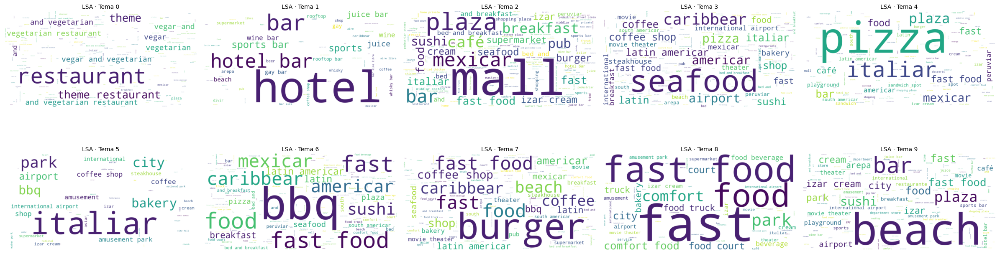

📈 Nubes de palabras guardadas en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LSA_wordclouds.png
🔎 LDA K óptimo (silhouette cosine): 10 | sil=0.1227


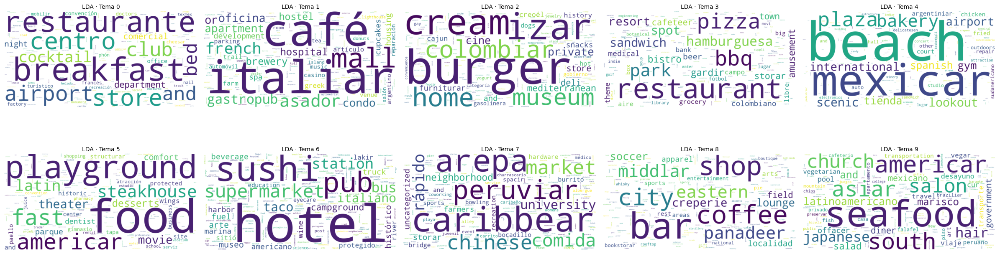

📈 Nubes de palabras guardadas en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LDA_wordclouds.png
🔎 KMeans K óptimo (silhouette cosine): 10 | sil=0.2351


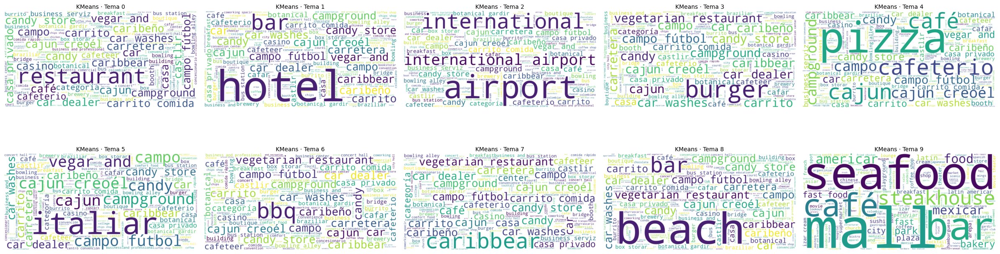

📈 Nubes de palabras guardadas en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\KMeans_wordclouds.png


2025-10-17 10:32:50,055 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.
2025-10-17 10:32:50,061 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-10-17 10:32:50,061 - BERTopic - Dimensionality - Completed ✓
2025-10-17 10:32:50,070 - BERTopic - Cluster - Start clustering the reduced embeddings


⚠️ Incompatibilidad UMAP↔scikit-learn. Usando identidad.


2025-10-17 10:33:07,156 - BERTopic - Cluster - Completed ✓
2025-10-17 10:33:07,160 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-10-17 10:33:07,244 - BERTopic - Representation - Completed ✓


🔢 Clusters iniciales (HDBSCAN, sin -1): 81


2025-10-17 10:33:12,749 - BERTopic - Topic reduction - Reducing number of topics
2025-10-17 10:33:12,773 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-10-17 10:33:14,200 - BERTopic - Representation - Completed ✓
2025-10-17 10:33:14,202 - BERTopic - Topic reduction - Reduced number of topics from 82 to 23


🎯 Clusters que se grafican: 22 (modo: forzado a 23)


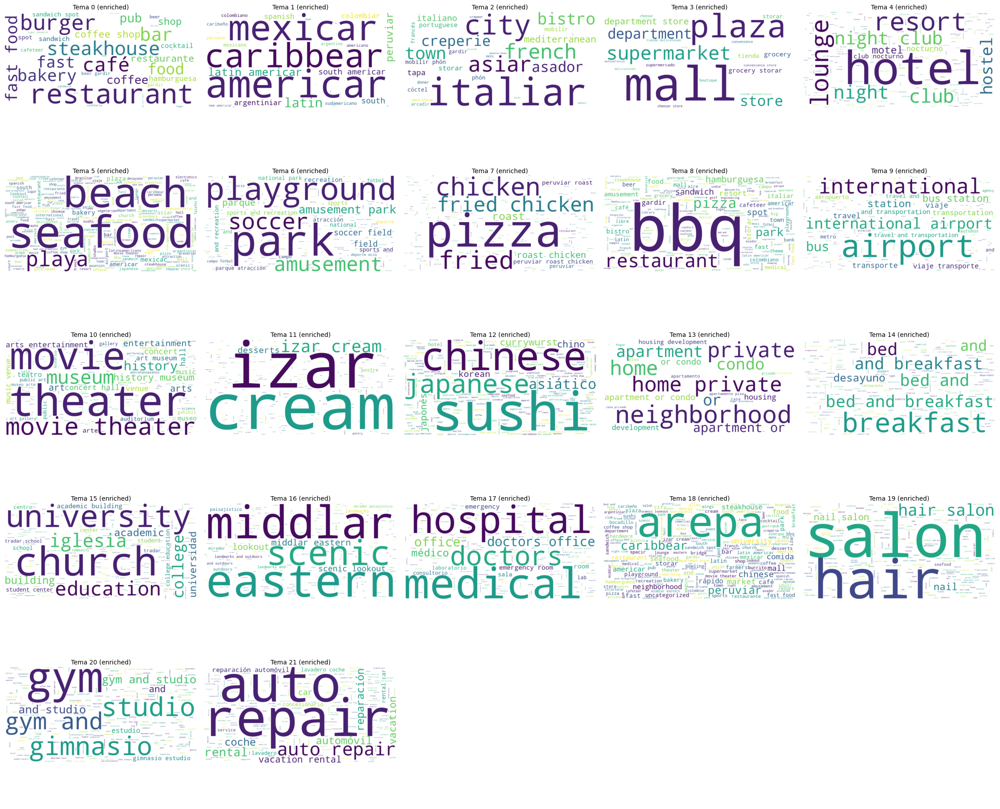

📈 Nube(s) de palabras ENRIQUECIDA(s) guardada(s) en: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\bertopic_plots\wordcloud_grid_22_topics_enriched_forced_seed42.png
✅ Archivo Excel con métricas: c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\metricas_clusters_por_modelo.xlsx
🖼️ Wordclouds (K óptimo silhouette / BERTopic grid ENRICHED):
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LSA_wordclouds.png
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\LDA_wordclouds.png
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\KMeans_wordclouds.png
   • c:\Users\danil\OneDrive\Documentos\articulo_2024\cluster_eval\bertopic_plots\wordcloud_grid_22_topics_enriched_forced_seed42.png


,modelo,cluster,n_docs,varianza_explicada,coseno_intra_tfidf,sim_semantica_intra,wilcoxon_stat,wilcoxon_p,coherencia_npmi,topic_uniqueness,silhouette_model,friedman_stat,friedman_p,perplejidad,diversidad_tematica_global
0,LSA,0,506,0.043913,0.418711,0.573694,89602.0,2.249656e-79,-0.591088,0.156490,0.192531,3488.622984,0.000000e+00,NaN,0.157750
1,LSA,1,325,0.042058,0.910170,0.948715,52975.0,6.119725e-69,-0.514345,0.151484,0.192531,3488.622984,0.000000e+00,NaN,0.157750
2,LSA,2,245,0.030870,0.829174,0.875080,30135.0,2.293391e-51,-0.641754,0.151226,0.192531,3488.622984,0.000000e+00,NaN,0.157750
3,LSA,3,417,0.025572,0.321530,0.499586,87153.0,1.589379e-72,-0.659139,0.160522,0.192531,3488.622984,0.000000e+00,NaN,0.157750
4,LSA,4,309,0.025449,0.361553,0.501187,47895.0,1.906936e-55,-0.656206,0.156691,0.192531,3488.622984,0.000000e+00,NaN,0.157750
5,LSA,5,197,0.025329,0.846835,0.923737,19503.0,4.323579e-42,-0.602382,0.163957,0.192531,3488.622984,0.000000e+00,NaN,0.157750
6,LSA,6,975,0.024214,0.063737,0.301489,475782.0,1.004354e-161,-0.626696,0.155719,0.192531,3488.622984,0.000000e+00,NaN,0.157750
7,LSA,7,1365,0.023644,0.049374,0.296001,931686.0,1.228920e-224,-0.656307,0.157608,0.192531,3488.622984,0.000000e+00,NaN,0.157750
8,LSA,8,1467,0.023106,0.044482,0.262231,1076671.0,1.035475e-241,-0.576082,0.160210,0.192531,3488.622984,0.000000e+00,NaN,0.157750
9,LSA,9,1349,0.022626,0.054365,0.327752,910267.0,2.353250e-222,-0.639015,0.163591,0.192531,3488.622984,0.000000e+00,NaN,0.157750



Vista rápida de BT topics_info (incluye n_keywords y n_keywords_enriched):
 Topic  Count                                              Name                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

In [12]:
# =========================================
#     PARTE 6 — Pipeline unificado (ajustes solicitados)
#     LSA / LDA / KMeans / BERTopic
#     (PREPROCESAMIENTO: limpieza + stopwords + lematización, SIN NOUN CHUNKS)
# =========================================

# ---------- Lectura ----------
import pandas as pd
input_file = 'df_con_tipo_turista.xlsx'  # archivo original
df_raw = pd.read_excel(input_file)

# ✅ 1) Trabajar sobre una COPIA del Excel original
df = df_raw.copy(deep=True)

# ---------- IMPORTS BÁSICOS ----------
import os, math, random, re, warnings
warnings.filterwarnings("ignore")

import numpy as np
import matplotlib.pyplot as plt
from collections import Counter, defaultdict

# NLP / CLUSTERING / MÉTRICAS
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity, cosine_distances
from sklearn.preprocessing import normalize
from scipy.stats import wilcoxon, friedmanchisquare

# Torch / embeddings
import torch
from sentence_transformers import SentenceTransformer

# Tópicos (gensim)
from gensim.corpora import Dictionary
from gensim.models import CoherenceModel, LdaModel

# BERTopic + HDBSCAN + UMAP + KeyBERTInspired
import hdbscan
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired
try:
    from umap import UMAP
    HAS_UMAP = True
except Exception:
    HAS_UMAP = False

# Stopwords ES
from spacy.lang.es.stop_words import STOP_WORDS as SPACY_STOP_WORDS
from wordcloud import WordCloud

# ---------- Semillas / determinismo ----------
RANDOM_STATE = 42
os.environ["PYTHONHASHSEED"] = str(RANDOM_STATE)
os.environ["TOKENIZERS_PARALLELISM"] = "false"
random.seed(RANDOM_STATE)
np.random.seed(RANDOM_STATE)

# ---------- GPU ----------
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
try:
    torch.set_float32_matmul_precision("high")
except Exception:
    pass
try:
    torch.manual_seed(RANDOM_STATE)
    if DEVICE == "cuda":
        torch.cuda.manual_seed_all(RANDOM_STATE)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True)
except Exception:
    pass
print(f"🟢 Dispositivo embeddings/BERTopic: {DEVICE}")

# ============================================================
#  PREPROCESAMIENTO (SIN NOUN CHUNKS)
# ============================================================

class TextProcessing(object):
    def __init__(self, lang: str = 'es'):
        self.lang = lang
        self.nlp = self.load_spacy(lang)
        self.additional_stop = set(["q", "más", "mas", "da", "xd"])

    @staticmethod
    def load_spacy(lang: str):
        import spacy
        from spacy import cli as spacy_cli
        spacy_model = {'es': 'es_core_news_sm', 'en': 'en_core_web_sm'}
        pkg = spacy_model.get(lang, 'es_core_news_sm')
        try:
            if not spacy.util.is_package(pkg):
                spacy_cli.download(pkg)
            return spacy.load(pkg, disable=["ner"])
        except Exception as e:
            print(f'Error loading spaCy: {e}')
            raise

    @staticmethod
    def _clean_basic(text: str) -> str:
        if not isinstance(text, str) or not text.strip():
            return ""
        t = text.lower()
        t = re.sub("[\U0001f000-\U000e007f]", " ", t)
        t = re.sub(
            r'(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)'
            r'(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+'
            r'(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:\'".,<>?«»“”‘’]))',
            ' ', t
        )
        t = re.sub(r"@([A-Za-z0-9_]{1,40})", " ", t)
        t = re.sub(r"#([A-Za-z0-9_]{1,40})", " ", t)
        t = re.sub(r"\s+", " ", t).strip()
        return t

    def _lemmas_from_doc(self, doc):
        out = []
        for tok in doc:
            if tok.is_stop or tok.is_punct or tok.is_space or tok.like_num:
                continue
            lemma = tok.lemma_.lower().strip()
            if not lemma: continue
            if lemma in self.additional_stop: continue
            lemma = re.sub(r"[^0-9a-záéíóúüñ]+", "", lemma)
            if len(lemma) < 2: continue
            out.append(lemma)
        return " ".join(out)

    def transform_bulk(self, texts):
        cleaned = [self._clean_basic(t if isinstance(t, str) else "") for t in texts]
        out = []
        try:
            for doc in self.nlp.pipe(cleaned, batch_size=256, n_process=1):
                out.append(self._lemmas_from_doc(doc))
        except Exception:
            for t in cleaned:
                out.append(self._lemmas_from_doc(self.nlp(t)))
        out = [re.sub(r"[^\wáéíóúüñ\s]", " ", s) for s in out]
        out = [re.sub(r"\s+", " ", s).strip() for s in out]
        return out

# --- 2) Usar la columna reviewed_category como texto base ---
BASE_TEXT_COL = "reviewed_category"
if BASE_TEXT_COL not in df.columns:
    raise KeyError(f"No se encontró la columna requerida: {BASE_TEXT_COL}")

tp = TextProcessing(lang='es')
df["Text_clean"] = tp.transform_bulk(df[BASE_TEXT_COL].astype(str).tolist())

# --- 3) Documentos finales para TODO el pipeline ---
docs_series = pd.Series(df["Text_clean"]).astype(str).fillna("").str.strip()
mask = docs_series.str.len() > 0
docs = docs_series[mask].tolist()
orig_index = df.index[mask]
if len(docs) == 0:
    raise RuntimeError("No hay documentos válidos después del preprocesamiento.")

# ============================================================
#   Representaciones compartidas (sobre Text_clean)
# ============================================================

TOPN_WORDS = 400             # LSA/LDA/KMeans wordclouds
TOP_N_KEYWORDS = 1200        # BERTopic/KeyBERTInspired (muchas palabras)

tfidf_vec = TfidfVectorizer(
    lowercase=True,
    token_pattern=r"(?u)\b\w\w+\b",
    min_df=2, max_df=0.98,
    ngram_range=(1,3),
    dtype=np.float32
)
X_tfidf = tfidf_vec.fit_transform(docs)
tfidf_terms = np.array(tfidf_vec.get_feature_names_out())

EMBEDDING_MODEL_NAME = "sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2"
embedder = SentenceTransformer(EMBEDDING_MODEL_NAME, device=DEVICE)
X_emb = embedder.encode(
    docs, show_progress_bar=True, normalize_embeddings=True, convert_to_numpy=True
).astype(np.float32)

tokenized = [t.split() for t in docs]
dictionary = Dictionary(tokenized)
dictionary.filter_extremes(no_below=2, no_above=0.98)
corpus = [dictionary.doc2bow(toks) for toks in tokenized]

# Carpeta local
BASE_DIR = os.path.abspath(os.path.join(".", "cluster_eval"))
SAVE_DIR = BASE_DIR
PLOT_DIR = os.path.join(BASE_DIR, "bertopic_plots")
os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

# ============================================================
#   Utilidades métricas y visuales
# ============================================================

def safe_silhouette_score(X, labels, max_samples=5000, metric="cosine"):
    labels = np.asarray(labels)
    if len(set(labels)) <= 1: return np.nan
    n = X.shape[0]
    if n > max_samples:
        rng = np.random.RandomState(RANDOM_STATE)
        idx = rng.choice(n, size=max_samples, replace=False)
        X_sub, labels_sub = X[idx], labels[idx]
    else:
        X_sub, labels_sub = X, labels
    try:
        return float(silhouette_score(X_sub, labels_sub, metric=metric))
    except Exception:
        return np.nan

def top_terms_from_vector(vec, terms, topn=20):
    idx = np.argpartition(vec, -topn)[-topn:]
    idx = idx[np.argsort(-vec[idx])]
    return [(terms[i], float(vec[i])) for i in idx]

def topic_uniqueness(all_topic_words):
    flat = [w for words in all_topic_words for w in words]
    counts = Counter(flat)
    unq_scores = []
    for words in all_topic_words:
        if not words: unq_scores.append(np.nan); continue
        scores = [1.0 / counts[w] for w in words]
        unq_scores.append(float(np.mean(scores)))
    return unq_scores

def topic_diversity(all_topic_words):
    total = sum(len(ws) for ws in all_topic_words)
    if total == 0: return np.nan
    unique_words = len(set([w for ws in all_topic_words for w in ws]))
    return unique_words / total

def avg_intra_cosine(X, labels, max_sample=1000):
    labels = np.asarray(labels)
    avg_per_cluster = {}
    for c in sorted(set(labels)):
        idx = np.where(labels == c)[0]
        if len(idx) < 2: avg_per_cluster[c] = np.nan; continue
        sel = idx if len(idx) <= max_sample else np.random.RandomState(RANDOM_STATE).choice(idx, size=max_sample, replace=False)
        S = cosine_similarity(X[sel], X[sel])
        m = (np.sum(S) - np.trace(S)) / (S.shape[0]*S.shape[0] - S.shape[0])
        avg_per_cluster[c] = float(m)
    return avg_per_cluster

def avg_intra_semantic_cosine(emb, labels, max_sample=2000):
    labels = np.asarray(labels)
    avg_per_cluster = {}
    for c in sorted(set(labels)):
        idx = np.where(labels == c)[0]
        if len(idx) < 2: avg_per_cluster[c] = np.nan; continue
        sel = idx if len(idx) <= max_sample else np.random.RandomState(RANDOM_STATE).choice(idx, size=max_sample, replace=False)
        S = cosine_similarity(emb[sel], emb[sel])
        m = (np.sum(S) - np.trace(S)) / (S.shape[0]*S.shape[0] - S.shape[0])
        avg_per_cluster[c] = float(m)
    return avg_per_cluster

def wilcoxon_own_vs_other_sparse(X_csr, labels, centroids):
    labels = np.asarray(labels)
    clusters_sorted = sorted(set(labels))
    Xn = normalize(X_csr, norm='l2', copy=True)
    cent = centroids.astype(np.float32)
    cent /= (np.linalg.norm(cent, axis=1, keepdims=True) + 1e-12).astype(np.float32)
    results = {}
    for idx_c, c in enumerate(clusters_sorted):
        rows = np.where(labels == c)[0]
        if len(rows) < 10: results[c] = (np.nan, np.nan); continue
        sims = Xn[rows].dot(cent.T)
        own = sims[:, idx_c]
        if sims.shape[1] == 1: results[c] = (np.nan, np.nan); continue
        other = np.max(np.delete(sims, idx_c, axis=1), axis=1)
        diff = own - other
        if not np.any(diff): results[c] = (np.nan, np.nan); continue
        try:
            stat, p = wilcoxon(diff, zero_method="wilcox", alternative="greater")
            results[c] = (float(stat), float(p))
        except Exception:
            results[c] = (np.nan, np.nan)
    return results

def friedman_global(dist_matrix):
    if dist_matrix.shape[1] < 3: return np.nan, np.nan
    args = [dist_matrix[:, j] for j in range(dist_matrix.shape[1])]
    try:
        stat, p = friedmanchisquare(*args)
        return float(stat), float(p)
    except Exception:
        return np.nan, np.nan

def make_wordcloud_grid(topic_wordfreqs, title, out_path):
    n = len(topic_wordfreqs)
    if n == 0:
        print(f"⚠️ {title}: No hay temas para graficar."); return
    cols = 5 if n >= 10 else (4 if n >= 8 else (3 if n >= 5 else max(1, n)))
    rows = int(math.ceil(n / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4.8*cols, 4.0*rows))
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = np.array([axes])
    elif cols == 1:
        axes = axes.reshape(-1, 1)
    idx = 0
    for r in range(rows):
        for c in range(cols):
            ax = axes[r, c]
            if idx >= n:
                ax.axis("off"); continue
            freqs = topic_wordfreqs[idx]
            if not freqs:
                ax.text(0.5, 0.5, f"Tema {idx}\n(sin palabras)", ha="center", va="center"); ax.axis("off")
            else:
                wc = WordCloud(width=1200, height=600, background_color="white",
                               collocations=False, prefer_horizontal=0.9,
                               random_state=RANDOM_STATE).generate_from_frequencies(freqs)
                ax.imshow(wc, interpolation="bilinear"); ax.axis("off"); ax.set_title(f"{title} · Tema {idx}", pad=4, fontsize=10)
            idx += 1
    plt.tight_layout(); plt.savefig(out_path, dpi=150, bbox_inches="tight"); plt.show(); plt.close()
    print(f"📈 Nubes de palabras guardadas en: {out_path}")

# ============================================================
#   A) WORDCLOUDS CON K ÓPTIMO (silhouette cosine)
# ============================================================

def lsa_wordcloud_opt(X_tfidf, tfidf_terms, k_min=2, k_max=10):
    best_k, best_sc, best_freqs = None, -np.inf, None
    for k in range(k_min, k_max+1):
        svd_tmp = TruncatedSVD(n_components=k, random_state=RANDOM_STATE)
        X_lsa_tmp = svd_tmp.fit_transform(X_tfidf)
        labels_tmp = np.argmax(X_lsa_tmp, axis=1)
        sc = safe_silhouette_score(X_tfidf, labels_tmp, metric="cosine")
        sc = -1 if np.isnan(sc) else sc
        topic_wordfreqs = []
        for i in range(k):
            pairs = top_terms_from_vector(svd_tmp.components_[i], tfidf_terms, topn=TOPN_WORDS)
            topic_wordfreqs.append({w: max(s, 1e-9) for w, s in pairs})
        if sc > best_sc:
            best_k, best_sc, best_freqs = k, sc, topic_wordfreqs
    print(f"🔎 LSA K óptimo (silhouette cosine): {best_k} | sil={best_sc:.4f}")
    return best_k, best_freqs

def lda_wordcloud_opt(corpus, dictionary, tokenized, X_tfidf, k_min=2, k_max=10):
    best_k, best_sc, best_freqs = None, -np.inf, None
    for k in range(k_min, k_max+1):
        lda_tmp = LdaModel(corpus=corpus, id2word=dictionary, num_topics=k,
                           random_state=RANDOM_STATE, iterations=300, passes=5,
                           alpha='auto', eta='auto', minimum_probability=0.0,
                           chunksize=2000, eval_every=None)
        topic_wordfreqs = []
        for i in range(k):
            terms = lda_tmp.get_topic_terms(i, topn=TOPN_WORDS)
            topic_wordfreqs.append({dictionary[t]: float(w) for t, w in terms})
        doc_labels = []
        for bow in corpus:
            dist = lda_tmp.get_document_topics(bow, minimum_probability=0.0)
            dist = np.array([p for _, p in sorted(dist, key=lambda x: x[0])], dtype=np.float32)
            doc_labels.append(int(np.argmax(dist)))
        doc_labels = np.array(doc_labels)
        sc = safe_silhouette_score(X_tfidf, doc_labels, metric="cosine")
        sc = -1 if np.isnan(sc) else sc
        if sc > best_sc:
            best_k, best_sc, best_freqs = k, sc, topic_wordfreqs
    print(f"🔎 LDA K óptimo (silhouette cosine): {best_k} | sil={best_sc:.4f}")
    return best_k, best_freqs

def kmeans_wordcloud_opt(X_tfidf, tfidf_terms, k_min=2, k_max=10):
    best_k, best_sc, best_freqs = None, -np.inf, None
    for k in range(k_min, k_max+1):
        km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10)
        labels = km.fit_predict(X_tfidf)
        sc = safe_silhouette_score(X_tfidf, labels, metric="cosine")
        sc = -1 if np.isnan(sc) else sc
        topic_wordfreqs = []
        for i in range(k):
            pairs = top_terms_from_vector(km.cluster_centers_[i].astype(np.float32), tfidf_terms, topn=TOPN_WORDS)
            topic_wordfreqs.append({w: max(s, 1e-9) for w, s in pairs})
        if sc > best_sc:
            best_k, best_sc, best_freqs = k, sc, topic_wordfreqs
    print(f"🔎 KMeans K óptimo (silhouette cosine): {best_k} | sil={best_sc:.4f}")
    return best_k, best_freqs

# ---- Generar wordclouds óptimos para LSA/LDA/KMeans ----
lsa_kopt, lsa_wc_freqs = lsa_wordcloud_opt(X_tfidf, tfidf_terms)
make_wordcloud_grid(lsa_wc_freqs, "LSA", os.path.join(SAVE_DIR, "LSA_wordclouds.png"))

lda_kopt, lda_wc_freqs = lda_wordcloud_opt(corpus, dictionary, tokenized, X_tfidf)
make_wordcloud_grid(lda_wc_freqs, "LDA", os.path.join(SAVE_DIR, "LDA_wordclouds.png"))

km_kopt, km_wc_freqs = kmeans_wordcloud_opt(X_tfidf, tfidf_terms)
make_wordcloud_grid(km_wc_freqs, "KMeans", os.path.join(SAVE_DIR, "KMeans_wordclouds.png"))

# ============================================================
#   B) MÉTRICAS CON K=10 (o K<=N en BERTopic)
# ============================================================

# ---------- LSA (K=10) ----------
N_TOPICS_LSA = 10
svd = TruncatedSVD(n_components=N_TOPICS_LSA, random_state=RANDOM_STATE)
X_lsa = svd.fit_transform(X_tfidf)
labels_lsa = np.argmax(X_lsa, axis=1)

lsa_topic_words, lsa_topic_wordfreqs_metrics = [], []
for k in range(N_TOPICS_LSA):
    comp = svd.components_[k]
    pairs = top_terms_from_vector(comp, tfidf_terms, topn=TOPN_WORDS)
    lsa_topic_words.append([w for w, s in pairs])
    lsa_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in pairs})

var_expl = svd.explained_variance_ratio_
var_expl_k = {k: float(var_expl[k]) for k in range(N_TOPICS_LSA)}

cos_intra = avg_intra_cosine(X_tfidf, labels_lsa)
sem_intra = avg_intra_semantic_cosine(X_emb, labels_lsa)

centroids_lsa = []
for c in sorted(set(labels_lsa)):
    idx = np.where(labels_lsa == c)[0]
    centroids_lsa.append(X_tfidf[idx].mean(axis=0).A1.astype(np.float32))
centroids_lsa = np.vstack(centroids_lsa).astype(np.float32)

wilco_lsa = wilcoxon_own_vs_other_sparse(X_tfidf, labels_lsa, centroids_lsa)
sil_lsa = safe_silhouette_score(X_tfidf, labels_lsa, max_samples=5000, metric="cosine")

coh_values_lsa = []
for words in lsa_topic_words:
    cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
    coh_values_lsa.append(float(cm.get_coherence()))

div_lsa = topic_diversity(lsa_topic_words)
uni_lsa = topic_uniqueness(lsa_topic_words)

D_lsa = cosine_distances(X_tfidf, centroids_lsa)
fried_stat_lsa, fried_p_lsa = friedman_global(D_lsa)

rows = []
for k in sorted(set(labels_lsa)):
    w_stat, w_p = wilco_lsa.get(k, (np.nan, np.nan))
    rows.append({
        "modelo": "LSA",
        "cluster": k,
        "n_docs": int((labels_lsa == k).sum()),
        "varianza_explicada": var_expl_k.get(k, np.nan),
        "coseno_intra_tfidf": cos_intra.get(k, np.nan),
        "sim_semantica_intra": sem_intra.get(k, np.nan),
        "wilcoxon_stat": w_stat,
        "wilcoxon_p": w_p,
        "coherencia_npmi": coh_values_lsa[k] if k < len(coh_values_lsa) else np.nan,
        "topic_uniqueness": uni_lsa[k] if k < len(uni_lsa) else np.nan,
        "silhouette_model": sil_lsa,
        "friedman_stat": fried_stat_lsa,
        "friedman_p": fried_p_lsa,
        "perplejidad": np.nan,
        "diversidad_tematica_global": div_lsa
    })
metrics_lsa = pd.DataFrame(rows)

# ---------- LDA (K=10) ----------
N_TOPICS_LDA = 10
lda = LdaModel(
    corpus=corpus, id2word=dictionary, num_topics=N_TOPICS_LDA,
    random_state=RANDOM_STATE, iterations=500, passes=10,
    alpha='auto', eta='auto', minimum_probability=0.0,
    chunksize=2000, eval_every=None
)

# ⚠️ Guardamos la matriz doc–topic con un nombre que NO se pisa luego
doc_topics_lda_list = []
labels_lda = []
for bow in corpus:
    dist = lda.get_document_topics(bow, minimum_probability=0.0)
    dist = np.array([p for _, p in sorted(dist, key=lambda x: x[0])], dtype=np.float32)
    doc_topics_lda_list.append(dist)
    labels_lda.append(int(np.argmax(dist)))
doc_topic_dist_lda = np.vstack(doc_topics_lda_list)   # shape: (n_docs, N_TOPICS_LDA)
labels_lda = np.array(labels_lda)

log_perp = lda.log_perplexity(corpus)
perplexity_lda = float(np.exp(-log_perp))

lda_topic_words, lda_topic_wordfreqs_metrics = [], []
for k in range(N_TOPICS_LDA):
    terms = lda.get_topic_terms(k, topn=TOPN_WORDS)
    words = [(dictionary[t], float(w)) for t, w in terms]
    lda_topic_words.append([w for w, s in words])
    lda_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in words})

coh_values_lda = []
for words in lda_topic_words:
    cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
    coh_values_lda.append(float(cm.get_coherence()))

cos_intra_lda = avg_intra_cosine(X_tfidf, labels_lda)
sem_intra_lda = avg_intra_semantic_cosine(X_emb, labels_lda)

centroids_lda = []
for c in sorted(set(labels_lda)):
    idx = np.where(labels_lda == c)[0]
    centroids_lda.append(X_tfidf[idx].mean(axis=0).A1.astype(np.float32))
centroids_lda = np.vstack(centroids_lda).astype(np.float32)

wilco_lda = wilcoxon_own_vs_other_sparse(X_tfidf, labels_lda, centroids_lda)
sil_lda = safe_silhouette_score(X_tfidf, labels_lda, max_samples=5000, metric="cosine")

div_lda = topic_diversity(lda_topic_words)
uni_lda = topic_uniqueness(lda_topic_words)

D_lda = cosine_distances(X_tfidf, centroids_lda)
fried_stat_lda, fried_p_lda = friedman_global(D_lda)

rows = []
for k in sorted(set(labels_lda)):
    w_stat, w_p = wilco_lda.get(k, (np.nan, np.nan))
    rows.append({
        "modelo": "LDA",
        "cluster": k,
        "n_docs": int((labels_lda == k).sum()),
        "varianza_explicada": np.nan,
        "coseno_intra_tfidf": cos_intra_lda.get(k, np.nan),
        "sim_semantica_intra": sem_intra_lda.get(k, np.nan),
        "wilcoxon_stat": w_stat,
        "wilcoxon_p": w_p,
        "coherencia_npmi": coh_values_lda[k] if k < len(coh_values_lda) else np.nan,
        "topic_uniqueness": uni_lda[k] if k < len(uni_lda) else np.nan,
        "silhouette_model": sil_lda,
        "friedman_stat": fried_stat_lda,
        "friedman_p": fried_p_lda,
        "perplejidad": perplexity_lda,
        "diversidad_tematica_global": div_lda
    })
metrics_lda = pd.DataFrame(rows)

# ---------- KMeans (K=10) ----------
N_CLUSTERS_KM = 10
kmeans = KMeans(n_clusters=N_CLUSTERS_KM, random_state=RANDOM_STATE, n_init=10)
labels_km = kmeans.fit_predict(X_tfidf)

km_topic_words, km_topic_wordfreqs_metrics = [], []
for k in range(N_CLUSTERS_KM):
    cent = kmeans.cluster_centers_[k].astype(np.float32)
    pairs = top_terms_from_vector(cent, tfidf_terms, topn=TOPN_WORDS)
    km_topic_words.append([w for w, s in pairs])
    km_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in pairs})

cos_intra_km = avg_intra_cosine(X_tfidf, labels_km)
sem_intra_km = avg_intra_semantic_cosine(X_emb, labels_km)
sil_km = safe_silhouette_score(X_tfidf, labels_km, max_samples=5000, metric="cosine")

div_km = topic_diversity(km_topic_words)
uni_km = topic_uniqueness(km_topic_words)

centroids_km = kmeans.cluster_centers_.astype(np.float32)
wilco_km = wilcoxon_own_vs_other_sparse(X_tfidf, labels_km, centroids_km)

D_km = cosine_distances(X_tfidf, centroids_km)
fried_stat_km, fried_p_km = friedman_global(D_km)

coh_values_km = []
for words in km_topic_words:
    cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
    coh_values_km.append(float(cm.get_coherence()))

rows = []
for k in sorted(set(labels_km)):
    w_stat, w_p = wilco_km.get(k, (np.nan, np.nan))
    rows.append({
        "modelo": "KMeans",
        "cluster": k,
        "n_docs": int((labels_km == k).sum()),
        "varianza_explicada": np.nan,
        "coseno_intra_tfidf": cos_intra_km.get(k, np.nan),
        "sim_semantica_intra": sem_intra_km.get(k, np.nan),
        "wilcoxon_stat": w_stat,
        "wilcoxon_p": w_p,
        "coherencia_npmi": coh_values_km[k] if k < len(coh_values_km) else np.nan,
        "topic_uniqueness": uni_km[k] if k < len(uni_km) else np.nan,
        "silhouette_model": sil_km,
        "friedman_stat": fried_stat_km,
        "friedman_p": fried_p_km,
        "perplejidad": np.nan,
        "diversidad_tematica_global": div_km
    })
metrics_km = pd.DataFrame(rows)

# ============================================================
#   C) BERTopic (UMAP con fallback) + KeyBERTInspired
# ============================================================

TARGET_TOPICS = 23  # puedes ajustar a 9 si lo prefieres

class IdentityDim:
    def fit(self, X, y=None, **kwargs): return self
    def fit_transform(self, X, y=None, **kwargs): return X
    def transform(self, X, **kwargs): return X

def build_umap_or_identity():
    if not HAS_UMAP:
        print("⚠️ UMAP no disponible. Usando identidad.")
        return IdentityDim(), False
    try:
        umap_model = UMAP(
            n_neighbors=12, n_components=10, min_dist=0.01,
            metric="cosine", random_state=RANDOM_STATE
        )
        _X = np.random.RandomState(0).randn(20, 32).astype(np.float32)
        try:
            umap_model.fit(_X)
            return umap_model, True
        except TypeError as e:
            if "ensure_all_finite" in str(e) or "force_all_finite" in str(e):
                print("⚠️ Incompatibilidad UMAP↔scikit-learn. Usando identidad.")
                return IdentityDim(), False
            else:
                raise
    except Exception as e:
        print(f"⚠️ No se pudo inicializar UMAP real ({e}). Usando identidad.")
        return IdentityDim(), False

umap_model, umap_is_real = build_umap_or_identity()

hdbscan_model = hdbscan.HDBSCAN(
    min_cluster_size=25, min_samples=5, metric="euclidean",
    cluster_selection_method="eom", prediction_data=True, core_dist_n_jobs=1
)

# Vectorizador amplio (sin stopwords extra; ya limpiaste antes)
vectorizer_model = CountVectorizer(
    stop_words=None,
    lowercase=True,
    token_pattern=r"(?u)\b\w\w+\b",
    min_df=1, max_df=1.0,
    ngram_range=(1,3)
)

topic_model = BERTopic(
    embedding_model=embedder,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    language="spanish",
    calculate_probabilities=True,
    verbose=True,
    nr_topics=None,
    top_n_words=TOP_N_KEYWORDS,   # 1200
)

# -- Fit con manejo de incompatibilidad tardía --
try:
    topics_bt, probs_bt = topic_model.fit_transform(docs, embeddings=X_emb)
except TypeError as e:
    if "ensure_all_finite" in str(e) or "force_all_finite" in str(e):
        print("⚠️ Error compatibilidad BERTopic+UMAP. Reintentando con identidad...")
        topic_model = BERTopic(
            embedding_model=embedder,
            umap_model=IdentityDim(),
            hdbscan_model=hdbscan_model,
            vectorizer_model=vectorizer_model,
            language="spanish",
            calculate_probabilities=True,
            verbose=True,
            nr_topics=None,
            top_n_words=TOP_N_KEYWORDS,
        )
        topics_bt, probs_bt = topic_model.fit_transform(docs, embeddings=X_emb)
    else:
        raise

# Info inicial (antes de reducir)
topics_info_orig = topic_model.get_topic_info()
valid_topics_orig = topics_info_orig[topics_info_orig["Topic"] != -1]["Topic"].tolist()
n_clusters_orig = len(valid_topics_orig)
print(f"🔢 Clusters iniciales (HDBSCAN, sin -1): {n_clusters_orig}")

# Representación KeyBERTInspired (gran pool, sin MMR)
try:
    representation_model = KeyBERTInspired(
        top_n_words=TOP_N_KEYWORDS,
        nr_candidates=100000,
        random_state=RANDOM_STATE,
        mmr=False,
        diversity=0.0
    )
except TypeError:
    try:
        representation_model = KeyBERTInspired(
            top_n_words=TOP_N_KEYWORDS,
            nr_candidate_words=100000,
            random_state=RANDOM_STATE
        )
    except TypeError:
        representation_model = KeyBERTInspired(top_n_words=TOP_N_KEYWORDS)

topic_model.update_topics(docs, representation_model=representation_model)

# Reducción a TARGET_TOPICS si hay más
if isinstance(TARGET_TOPICS, int) and n_clusters_orig > TARGET_TOPICS:
    try:
        topic_model.reduce_topics(docs, nr_topics=TARGET_TOPICS)
    except TypeError:
        topic_model = topic_model.reduce_topics(docs, nr_topics=TARGET_TOPICS)
    topic_model.update_topics(docs, representation_model=representation_model)
elif isinstance(TARGET_TOPICS, int) and n_clusters_orig < TARGET_TOPICS:
    print(f"⚠️ No es posible aumentar a {TARGET_TOPICS} clusters (HDBSCAN devolvió {n_clusters_orig}). Se mantienen {n_clusters_orig}.")

# Info final + n_keywords
topics_info = topic_model.get_topic_info()
valid_topics = topics_info[topics_info["Topic"] != -1]["Topic"].tolist()
n_clusters_final = len(valid_topics)
print(f"🎯 Clusters que se grafican: {n_clusters_final} (modo: {'forzado a ' + str(TARGET_TOPICS) if isinstance(TARGET_TOPICS,int) else 'óptimo HDBSCAN'})")

def count_keywords(topic_id):
    pairs = topic_model.get_topic(topic_id) or []
    return len(pairs)
topics_info["n_keywords"] = topics_info["Topic"].apply(lambda t: count_keywords(t) if t != -1 else 0)

# topic_keywords (c-TFIDF/KeyBERT originales)
rows_kw = []
for t in valid_topics:
    pairs = topic_model.get_topic(t) or []
    for rank, (w, s) in enumerate(pairs[:TOP_N_KEYWORDS], start=1):
        rows_kw.append({"Topic": t, "Rank": rank, "Keyword": w, "Score": float(s)})
topic_keywords = pd.DataFrame(rows_kw, columns=["Topic", "Rank", "Keyword", "Score"])

# --- doc info BERTopic (NO pisar nombres LDA) ---
bt_doc_info = topic_model.get_document_info(docs)
bt_doc_info.insert(0, "doc_id", orig_index.values)
bt_doc_topics = bt_doc_info[["doc_id", "Topic", "Probability", "Name"]].rename(
    columns={"Topic": "topic", "Probability": "prob", "Name": "topic_name"}
)

# --- MÉTRICAS BERTopic (hasta TARGET_TOPICS temas) ---
BT_METRICS_K = TARGET_TOPICS
sorted_topics_all = sorted(valid_topics)
sorted_topics_K = sorted_topics_all[:min(BT_METRICS_K, len(sorted_topics_all))]
idmap = {t: i for i, t in enumerate(sorted_topics_K)}

labels_bt_raw = bt_doc_topics["topic"].to_numpy()
labels_bt_mapped = np.array([idmap.get(t, -1) for t in labels_bt_raw])
mask_valid_bt = labels_bt_mapped != -1
labels_bt_use = labels_bt_mapped[mask_valid_bt]

X_tfidf_valid = X_tfidf[mask_valid_bt]
X_emb_valid = X_emb[mask_valid_bt]

bt_topic_words_metrics, bt_topic_wordfreqs_metrics = [], []
for t in sorted_topics_K:
    pairs = topic_model.get_topic(t) or []
    words = [(w, float(s)) for w, s in pairs[:TOPN_WORDS]]
    bt_topic_words_metrics.append([w for w, s in words])
    bt_topic_wordfreqs_metrics.append({w: max(s, 1e-9) for w, s in words})

if X_tfidf_valid.shape[0] > 0 and len(set(labels_bt_use)) > 0:
    cos_intra_bt = avg_intra_cosine(X_tfidf_valid, labels_bt_use)
    sem_intra_bt = avg_intra_semantic_cosine(X_emb_valid, labels_bt_use)

    centroids_bt = []
    for i in range(len(sorted_topics_K)):
        idx = np.where(labels_bt_use == i)[0]
        if len(idx) == 0:
            centroids_bt.append(np.zeros((X_tfidf_valid.shape[1],), dtype=np.float32))
        else:
            centroids_bt.append(X_tfidf_valid[idx].mean(axis=0).A1.astype(np.float32))
    centroids_bt = np.vstack(centroids_bt).astype(np.float32)

    wilco_bt = wilcoxon_own_vs_other_sparse(X_tfidf_valid, labels_bt_use, centroids_bt)
    sil_bt = safe_silhouette_score(X_tfidf_valid, labels_bt_use, max_samples=5000, metric="cosine")

    coh_values_bt = []
    for words in bt_topic_words_metrics:
        cm = CoherenceModel(topics=[words], texts=tokenized, dictionary=dictionary, coherence='c_npmi')
        coh_values_bt.append(float(cm.get_coherence()))

    div_bt = topic_diversity(bt_topic_words_metrics)
    uni_bt = topic_uniqueness(bt_topic_words_metrics)
else:
    cos_intra_bt, sem_intra_bt, wilco_bt = {}, {}, {}
    sil_bt, coh_values_bt, div_bt, uni_bt = np.nan, [], np.nan, []

metrics_bt = pd.DataFrame([{
    "modelo": "BERTopic",
    "cluster": i,
    "n_docs": int((labels_bt_use == i).sum()) if mask_valid_bt.any() else 0,
    "varianza_explicada": np.nan,
    "coseno_intra_tfidf": cos_intra_bt.get(i, np.nan) if isinstance(cos_intra_bt, dict) else np.nan,
    "sim_semantica_intra": sem_intra_bt.get(i, np.nan) if isinstance(sem_intra_bt, dict) else np.nan,
    "wilcoxon_stat": (wilco_bt.get(i, (np.nan, np.nan))[0] if isinstance(wilco_bt, dict) else np.nan),
    "wilcoxon_p":    (wilco_bt.get(i, (np.nan, np.nan))[1] if isinstance(wilco_bt, dict) else np.nan),
    "coherencia_npmi": (coh_values_bt[i] if i < len(coh_values_bt) else np.nan),
    "topic_uniqueness": (uni_bt[i] if i < len(uni_bt) else np.nan),
    "silhouette_model": sil_bt,
    "friedman_stat": np.nan,
    "friedman_p": np.nan,
    "perplejidad": np.nan,
    "diversidad_tematica_global": div_bt
} for i in range(len(sorted_topics_K))])

# ============================================================
#   🔥 AJUSTE ÚNICO: ENRIQUECIMIENTO DE PALABRAS POR TÓPICO
#   (fusión de BERTopic + TFIDF intra + LDA + KMeans + LSA)
# ============================================================

TOP_N_KEYWORDS_ENRICHED = 2000   # aún más palabras por clúster

# Map: topic_id (BERTopic) -> posiciones de docs (en 'docs') que caen en ese topic
labels_bt_all = bt_doc_topics["topic"].to_numpy()   # alineado con 'docs'
topic_to_docpos = {t: np.where(labels_bt_all == t)[0] for t in valid_topics}

def merge_score_dicts(dicts_with_weights):
    acc = defaultdict(float)
    for d, w in dicts_with_weights:
        if d is None or w is None: continue
        for k, v in d.items():
            acc[k] += float(w) * float(v)
    return acc

# Pre-cálculos auxiliares (globales)
lsa_components = svd.components_
lda_word_dicts = lda_topic_wordfreqs_metrics
km_word_dicts  = km_topic_wordfreqs_metrics

# Enriquecimiento por tópico BERTopic
enriched_freqs_by_topic = {}    # topic_id -> {word: score}
enriched_rows = []

for t in valid_topics:
    pos = topic_to_docpos.get(t, np.array([], dtype=int))
    if pos.size == 0:
        enriched_freqs_by_topic[t] = {}
        continue

    # --- 1) Palabras originales BERTopic (c-TFIDF/KeyBERT)
    bt_pairs = topic_model.get_topic(t) or []
    bt_dict  = {w: float(s) for (w, s) in bt_pairs[:TOP_N_KEYWORDS_ENRICHED]}

    # --- 2) TF-IDF intra-tópico (suma de filas del cluster)
    tfidf_sum = np.asarray(X_tfidf[pos].sum(axis=0)).ravel()
    tfidf_pairs = top_terms_from_vector(tfidf_sum, tfidf_terms, topn=min(TOP_N_KEYWORDS_ENRICHED, tfidf_sum.size))
    tfidf_dict  = {w: float(s) for (w, s) in tfidf_pairs}

    # --- 3) LDA: tópicos LDA más presentes en este cluster (usar matriz NO pisada)
    if doc_topic_dist_lda.shape[0] == len(docs):
        lda_m = doc_topic_dist_lda[pos].mean(axis=0)   # promedio distrib. LDA
        top_lda_ids = np.argsort(-lda_m)[:3]
        lda_dict_merge = defaultdict(float)
        for lid in top_lda_ids:
            weight = float(lda_m[lid]) if lda_m.sum() > 0 else 0.0
            for w, s in lda_word_dicts[lid].items():
                lda_dict_merge[w] += weight * float(s)
        lda_dict = dict(lda_dict_merge)
    else:
        lda_dict = {}

    # --- 4) KMeans: clústeres KM dominantes dentro del tópico
    km_labels_sub = labels_km[pos]
    if km_labels_sub.size:
        vals, counts = np.unique(km_labels_sub, return_counts=True)
        order = np.argsort(-counts)
        top_km_ids = vals[order][:3]
        km_dict_merge = defaultdict(float)
        for kid in top_km_ids:
            weight = float((km_labels_sub == kid).mean())
            for w, s in km_word_dicts[kid].items():
                km_dict_merge[w] += weight * float(s)
        km_dict = dict(km_dict_merge)
    else:
        km_dict = {}

    # --- 5) LSA: componentes con mayor activación promedio en el cluster
    X_lsa_sub = X_lsa[pos] if len(X_lsa) == len(docs) else None
    if X_lsa_sub is not None and X_lsa_sub.size:
        comp_mean = X_lsa_sub.mean(axis=0)
        top_lsa_ids = np.argsort(-comp_mean)[:3]
        lsa_dict_merge = defaultdict(float)
        for cid in top_lsa_ids:
            weight = float(max(comp_mean[cid], 0.0))
            for w, s in lsa_topic_wordfreqs_metrics[cid].items():
                lsa_dict_merge[w] += weight * float(s)
        lsa_dict = dict(lsa_dict_merge)
    else:
        lsa_dict = {}

    # --- Fusión ponderada (prioriza BERTopic y TF-IDF intra)
    merged = merge_score_dicts([
        (bt_dict,   1.20),
        (tfidf_dict,1.00),
        (lda_dict,  0.80),
        (km_dict,   0.60),
        (lsa_dict,  0.50),
    ])

    # Normalización suave (opcional)
    if merged:
        mmin = min(merged.values()); mmax = max(merged.values())
        if mmax > mmin:
            for k in list(merged.keys()):
                merged[k] = (merged[k] - mmin) / (mmax - mmin) + 1e-9

    # Recortar al tope enriquecido
    items = sorted(merged.items(), key=lambda x: -x[1])[:TOP_N_KEYWORDS_ENRICHED]
    enriched_freqs_by_topic[t] = dict(items)

    # Para exportar a Excel
    for rank, (w, s) in enumerate(items, start=1):
        enriched_rows.append({"Topic": t, "Rank": rank, "Keyword": w, "Score": float(s)})

topic_keywords_enriched = pd.DataFrame(enriched_rows, columns=["Topic", "Rank", "Keyword", "Score"])

# Recuento de keywords enriquecidas por topic
topics_info["n_keywords_enriched"] = topics_info["Topic"].map(
    lambda t: (len(enriched_freqs_by_topic.get(t, {})) if t != -1 else 0)
)

# --- Wordclouds BERTopic usando vocabulario ENRIQUECIDO ---
def freqs_for_topic_enriched(topic_id, top_n=TOP_N_KEYWORDS_ENRICHED):
    freqs = enriched_freqs_by_topic.get(topic_id, {})
    if not freqs: return {}
    if len(freqs) <= top_n:
        return freqs
    return dict(sorted(freqs.items(), key=lambda x: -x[1])[:top_n])

n_clusters = len(valid_topics)
bt_grid_path = os.path.join(
    PLOT_DIR,
    f"wordcloud_grid_{n_clusters}_topics_enriched_{'forced' if isinstance(TARGET_TOPICS,int) else 'optimal'}_seed{RANDOM_STATE}.png"
)
if n_clusters == 0:
    print("⚠️ No hay temas válidos para graficar (todos -1).")
else:
    cols = 5 if n_clusters >= 10 else (4 if n_clusters >= 8 else (3 if n_clusters >= 5 else max(1, n_clusters)))
    rows = int(math.ceil(n_clusters / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(4.5*cols, 3.8*rows))
    if rows == 1 and cols == 1:
        axes = np.array([[axes]])
    elif rows == 1:
        axes = np.array([axes])
    elif cols == 1:
        axes = axes.reshape(-1, 1)
    idx = 0
    for r in range(rows):
        for c in range(cols):
            ax = axes[r, c]
            if idx >= n_clusters:
                ax.axis("off"); continue
            t_id = valid_topics[idx]
            freqs = freqs_for_topic_enriched(t_id, TOP_N_KEYWORDS_ENRICHED)
            if not freqs:
                ax.text(0.5, 0.5, f"Tema {t_id}\n(sin keywords)", ha="center", va="center")
                ax.axis("off")
            else:
                wc = WordCloud(
                    width=800, height=400, background_color="white",
                    collocations=False, prefer_horizontal=0.9,
                    random_state=RANDOM_STATE
                ).generate_from_frequencies(freqs)
                ax.imshow(wc, interpolation="bilinear")
                ax.axis("off")
                ax.set_title(f"Tema {t_id} (enriched)", pad=4, fontsize=10)
            idx += 1
    plt.tight_layout()
    plt.savefig(bt_grid_path, dpi=150, bbox_inches="tight")
    plt.show()
    print(f"📈 Nube(s) de palabras ENRIQUECIDA(s) guardada(s) en: {bt_grid_path}")

# ============================================================
#   D) RESÚMENES Y EXPORTACIÓN
# ============================================================
lsa_wc_path = os.path.join(SAVE_DIR, "LSA_wordclouds.png")
lda_wc_path = os.path.join(SAVE_DIR, "LDA_wordclouds.png")
km_wc_path  = os.path.join(SAVE_DIR, "KMeans_wordclouds.png")
bt_wc_path  = bt_grid_path

metrics_all = pd.concat([metrics_lsa, metrics_lda, metrics_km, metrics_bt], ignore_index=True)

excel_path = os.path.join(SAVE_DIR, "metricas_clusters_por_modelo.xlsx")
with pd.ExcelWriter(excel_path, engine="openpyxl") as writer:
    metrics_lsa.to_excel(writer, sheet_name="LSA", index=False)
    metrics_lda.to_excel(writer, sheet_name="LDA", index=False)
    metrics_km.to_excel(writer, sheet_name="KMeans", index=False)
    metrics_bt.to_excel(writer, sheet_name="BERTopic_metrics", index=False)
    metrics_all.to_excel(writer, sheet_name="Resumen", index=False)
    topics_info.to_excel(writer, sheet_name="BT_topics_info", index=False)
    topic_keywords.to_excel(writer, sheet_name="BT_topic_keywords", index=False)
    topic_keywords_enriched.to_excel(writer, sheet_name="BT_topic_keywords_enriched", index=False)
    bt_doc_topics.to_excel(writer, sheet_name="BT_doc_topics", index=False)

print("✅ Archivo Excel con métricas:", os.path.abspath(excel_path))
print("🖼️ Wordclouds (K óptimo silhouette / BERTopic grid ENRICHED):")
print("   •", os.path.abspath(lsa_wc_path))
print("   •", os.path.abspath(lda_wc_path))
print("   •", os.path.abspath(km_wc_path))
print("   •", os.path.abspath(bt_wc_path))

try:
    from IPython.display import display
    display(metrics_all.head(50))
    print("\nVista rápida de BT topics_info (incluye n_keywords y n_keywords_enriched):")
    print(topics_info.head(15).to_string(index=False))
except Exception:
    print(metrics_all.head(50))
    print("\nVista rápida de BT topics_info (incluye n_keywords y n_keywords_enriched):")
    print(topics_info.head(15).to_string(index=False))

